In [1]:
import xarray as xr
from matplotlib import pyplot as plt
import numpy as np
from cartopy import crs as ccrs
import pandas as pd
#import dask
import netCDF4
import xesmf as xe
from matplotlib.colors import SymLogNorm

In [2]:
# Missing mole fraction data - tells you in original scirpt that fp is mf/emissions 
# Look for missing mf data? Has he given it to us 
# Is it even important for what I need to do 

Concentration data 

In [3]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-ceda-20231103.nc') as f:
    rgl_conc = f.load()

In [4]:
rgl_conc

<xarray.Dataset>
Dimensions:            (time: 63422)
Coordinates:
  * time               (time) datetime64[ns] 2018-07-18T17:00:00 ... 2022-02-...
Data variables:
    radon              (time) float32 nan nan nan nan ... 0.5685 0.492 0.4665
    radon_uncertainty  (time) float32 nan nan nan ... 0.05415 0.04875 0.04818
Attributes: (12/14)
    species:              222Rn
    comment:              Measurments from ANSTO 1500 L dual-flow-loop two-fi...
    source:               In situ measurements of air
    station_long_name:    Ridge Hill, UK
    station_height_masl:  200.0
    station_latitude:     51.997435
    ...                   ...
    data_owner:           Simon O'Doherty
    data_owner_email:     s.odoherty@bristol.ac.uk
    processed_by:         Angelina Wenger, University of Bristol (angelina.we...
    Conventions:          CF-1.6
    Conditions of use:    Ensure that you contact the data owner at the outse...
    File created:         2023-11-03T12:09:34.155159+00:00

In [5]:
rgl_conc.radon.attrs

{'standard_name': 'radioactivity_concentration_of_222Rn_in_air',
 'long_name': '222Rn_activity_concentration',
 'units': 'Bq m-3',
 'comment': 'Best estimate of radon activity concentration. The reported values are deconvolved calibrated radon activity concentration corrected for standard temperature and pressure (288 K, 1013.25 hPa).',
 'ancilliary_variables': 'radon_uncertainty'}

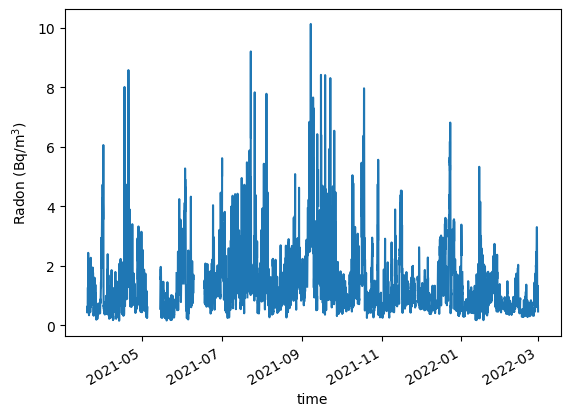

In [6]:
# Plot data for 2020
rgl_conc_2020 = rgl_conc.sel(time=slice("2021-06-01", "2021-06-30"))
rgl_conc["radon"].plot()

plt.ylabel("Radon (Bq/m$^3$)")

# increase margin at bottom
plt.subplots_adjust(bottom=0.2)

Reading footprints

In [7]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202011.nc') as f:
    rgl_202011 = f.load()

In [8]:
rgl_202011

<xarray.Dataset>
Dimensions:               (time: 720, lon: 391, lat: 293, lev: 1, height: 20)
Coordinates:
  * time                  (time) datetime64[ns] 2020-11-01 ... 2020-11-30T23:...
  * lon                   (lon) float32 -97.9 -97.55 -97.2 ... 38.68 39.03 39.38
  * lat                   (lat) float32 10.73 10.96 11.2 ... 78.59 78.82 79.06
  * lev                   (lev) |S1 b'F'
  * height                (height) float32 500.0 1.5e+03 ... 1.85e+04 1.95e+04
Data variables: (12/16)
    fp                    (lat, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    temperature           (time) float32 8.552 8.78 9.343 ... 7.742 6.732 6.038
    pressure              (time) float32 982.2 980.8 978.1 ... 997.6 998.3 998.5
    wind_speed            (time) float32 9.495 9.668 13.63 ... 7.516 8.815 6.994
    wind_direction        (time) float32 191.0 188.5 190.6 ... 340.6 338.1 329.2
    PBLH                  (time) float32 682.3 585.8 593.1 ... 591.6 350.5 230.0
    ...                    ...
    particle_locations_s  (height, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    particle_locations_w  (height, lat, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_n  (height, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_e  (height, lat, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_s  (height, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_w  (height, lat, time) float32 0.0 0.0 0.0 ... 0.0 0.0
Attributes: (12/14)
    fp_output_units:          ppm s
    fp_output:                Mixing Ratio
    species:                  Rn
    species_lifetime_hrs:     132.3768
    model:                    NAME
    met_model:                UKV
    ...                       ...
    domain:                   EUROPE
    site:                     RGL
    inlet_height:             90magl
    ACRG_repository_version:  v0.2.0-25-g058ec9a
    author:                   ag12733
    created:                  2021-04-30 14:28:33.579035

In [9]:
rgl_202011.attrs

{'fp_output_units': 'ppm s',
 'fp_output': 'Mixing Ratio',
 'species': 'Rn',
 'species_lifetime_hrs': 132.3768,
 'model': 'NAME',
 'met_model': 'UKV',
 'output_folder': 'MixR_hourly',
 'model_version': 'NAME III (version 7.2)                                          ',
 'domain': 'EUROPE',
 'site': 'RGL',
 'inlet_height': '90magl',
 'ACRG_repository_version': 'v0.2.0-25-g058ec9a',
 'author': 'ag12733',
 'created': '2021-04-30 14:28:33.579035'}

In [10]:
rgl_202011.fp.attrs
# When you multply this by the flux then left with mol per mol 
# Radon is not measured in mol/mol its measured in bq/m^3 in the file 
# It will depend on when it is emitted from the surface but I dont have that information 
#Convert from moles to an activity, an expression which involves the half life
# Bq is number of counts per second - so given what you know about its half life, how many bqs have been produced 
# May need to make an approximation about that

{'units': '(mol/mol)/(mol/m2/s)', 'loss_lifetime_hrs': '132.3768'}

In [11]:
rgl_202011.attrs

{'fp_output_units': 'ppm s',
 'fp_output': 'Mixing Ratio',
 'species': 'Rn',
 'species_lifetime_hrs': 132.3768,
 'model': 'NAME',
 'met_model': 'UKV',
 'output_folder': 'MixR_hourly',
 'model_version': 'NAME III (version 7.2)                                          ',
 'domain': 'EUROPE',
 'site': 'RGL',
 'inlet_height': '90magl',
 'ACRG_repository_version': 'v0.2.0-25-g058ec9a',
 'author': 'ag12733',
 'created': '2021-04-30 14:28:33.579035'}

In [12]:
rgl_202011.fp.attrs

{'units': '(mol/mol)/(mol/m2/s)', 'loss_lifetime_hrs': '132.3768'}

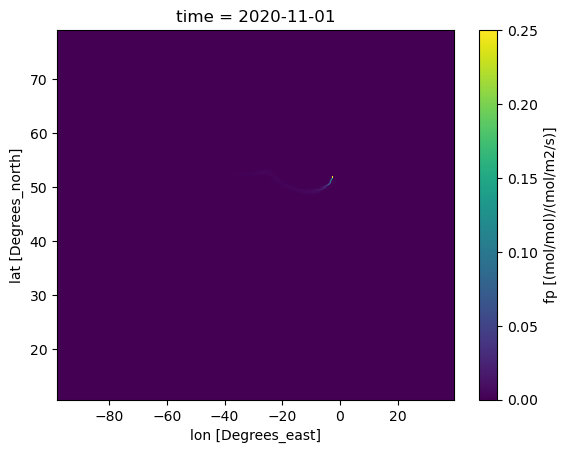

In [13]:
rgl_202011.fp.sel(time='2020-11 00:00').plot()

c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\xarray\core\computation.py:771: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


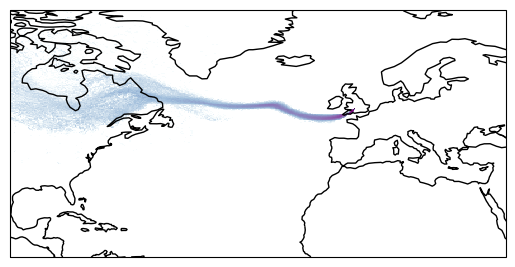

In [14]:
ax = plt.axes(projection = ccrs.PlateCarree())
ax.coastlines()
ax.pcolormesh(rgl_202011.lon, rgl_202011.lat, np.log10(rgl_202011.fp.sel(time = '2020-11 00:00')),
    transform=ccrs.PlateCarree(),
    cmap="BuPu")


c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\xarray\core\computation.py:771: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


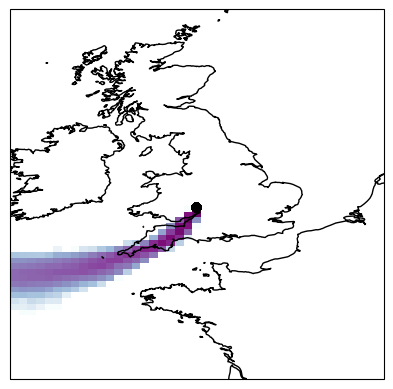

In [15]:
rgl_202011_uk = rgl_202011.sel(lon=slice(-10, 5), lat=slice(45, 60))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.pcolormesh(rgl_202011_uk.lon, rgl_202011_uk.lat,
    np.log10(rgl_202011_uk.fp.sel(time="2020-11 00:00")),
    transform=ccrs.PlateCarree(),
    cmap="BuPu")

# Add release location point
ax.plot(rgl_202011_uk.release_lon, rgl_202011_uk.release_lat, 'o', color="black", transform=ccrs.PlateCarree())

Using the model to predict concentrations 

In [16]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\InGOS_Radon_fluxmap_v2.0_noah_2006-2012.nc') as f:
    InGOS_fluxmap = f.load()

In [17]:
InGOS_fluxmap

<xarray.Dataset>
Dimensions:  (lon: 504, lat: 504, time: 84)
Coordinates:
  * lon      (lon) float32 -11.96 -11.88 -11.79 -11.71 ... 29.79 29.88 29.96
  * lat      (lat) float32 30.04 30.12 30.21 30.29 ... 71.71 71.79 71.88 71.96
  * time     (time) float64 2.006e+07 2.006e+07 ... 2.012e+07 2.012e+07
Data variables:
    rn_flux  (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Conventions:  CF-1.4
    title:        InGOS Radon flux map v2.0 (using GLDAS/Noah soil moisture)
    institution:  MPI Biogeochemistry Jena Germany & Institut fuer Umweltphys...
    contact:      Ute Karstens ute.karstens@nateko.lu.se

In [18]:
dates = [str(int(date)) for date in InGOS_fluxmap.time.values]
InGOS_fluxmap['time'] = [pd.to_datetime(date) for date in dates]

c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\xarray\core\computation.py:771: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


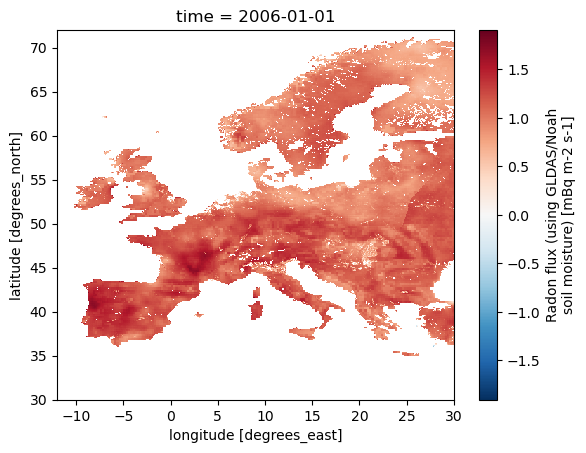

In [19]:
np.log10(InGOS_fluxmap.rn_flux.sel(time='2006-01 00:00')).plot()

In [20]:
InGOS_fluxmap
#rgl_202011

<xarray.Dataset>
Dimensions:  (lon: 504, lat: 504, time: 84)
Coordinates:
  * lon      (lon) float32 -11.96 -11.88 -11.79 -11.71 ... 29.79 29.88 29.96
  * lat      (lat) float32 30.04 30.12 30.21 30.29 ... 71.71 71.79 71.88 71.96
  * time     (time) datetime64[ns] 2006-01-01 2006-02-01 ... 2012-12-01
Data variables:
    rn_flux  (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Conventions:  CF-1.4
    title:        InGOS Radon flux map v2.0 (using GLDAS/Noah soil moisture)
    institution:  MPI Biogeochemistry Jena Germany & Institut fuer Umweltphys...
    contact:      Ute Karstens ute.karstens@nateko.lu.se

In [21]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202003.nc')as f:
    rgl_202003 = f.load()

In [22]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202011.nc') as f:
    rgl_202011 = f.load()

In [23]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\R_InGOS_Radon_fluxmap_v2.0_noah_2006-2012_regridded.nc') as f:
    regridded_InGOS = f.load()

In [24]:
# rgl_202003 is your target grid
#ds_target_grid = xr.Dataset({'lon': rgl_202003['lon'], 'lat': rgl_202003['lat']})

# Perform the regridding using reindex
#ds_flux_rn_regrid = InGOS_fluxmap.reindex({'lon': rgl_202003['lon'], 'lat': rgl_202003['lat']}, method='nearest')

# Replace Nans with zeros (Nans were used to indicate zero flux in this dataset)
#ds_flux_rn_regrid = ds_flux_rn_regrid.fillna(0)

# Not sure why this works but it works so im leaving it.
# spent too long trying to work out the error, hopefully it works for the rest of the code
# negronomy and gas dispersion model 

In [25]:
regridded_InGOS

<xarray.Dataset>
Dimensions:  (time: 84, lat: 293, lon: 391)
Coordinates:
  * time     (time) float64 2.006e+07 2.006e+07 ... 2.012e+07 2.012e+07
  * lon      (lon) float32 -97.9 -97.55 -97.2 -96.84 ... 38.32 38.68 39.03 39.38
  * lat      (lat) float32 10.73 10.96 11.2 11.43 ... 78.36 78.59 78.82 79.06
Data variables:
    rn_flux  (time, lat, lon) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes:
    Conventions:   CF-1.4
    title:         InGOS Radon flux map v2.0 (using GLDAS/Noah soil moisture)
    institution:   MPI Biogeochemistry Jena Germany & Institut fuer Umweltphy...
    contact:       Ute Karstens ute.karstens@nateko.lu.se
    comment:       Regridded to the UoB NAME footprint grid using xesmf
    regridded by:  Matt Rigby

In [26]:
regridded_InGOS.attrs

{'Conventions': 'CF-1.4',
 'title': 'InGOS Radon flux map v2.0 (using GLDAS/Noah soil moisture)',
 'institution': 'MPI Biogeochemistry Jena Germany & Institut fuer Umweltphysik University Heidelberg Germany',
 'contact': 'Ute Karstens ute.karstens@nateko.lu.se',
 'comment': 'Regridded to the UoB NAME footprint grid using xesmf',
 'regridded by': 'Matt Rigby'}

In [27]:
dates = [str(int(date)) for date in regridded_InGOS.time.values]
regridded_InGOS['time'] = [pd.to_datetime(date) for date in dates]

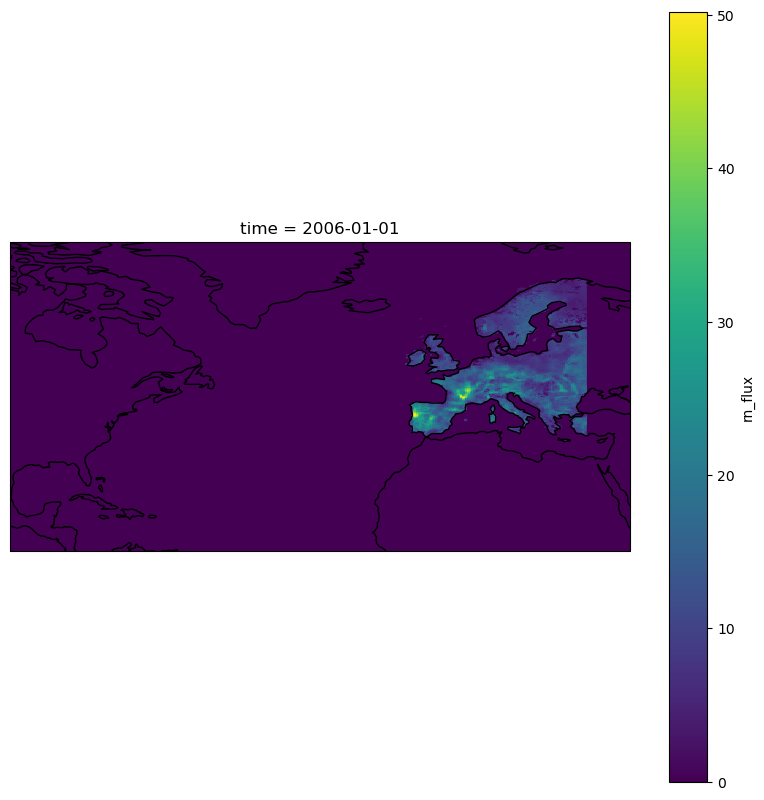

In [28]:
# Plot the regridded radon flux
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
regridded_InGOS['rn_flux'].sel({"time": "2006-01-01"}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')
plt.show()

In [29]:
lon_diff = np.diff(InGOS_fluxmap['lon'].values)[0]  # Assuming lon is regularly spaced
lat_diff = np.diff(InGOS_fluxmap['lat'].values)[0]  # Assuming lat is regularly spaced

# Calculate the area of each grid cell
area_original = lon_diff * lat_diff

# Repeat the same for the regridded dataset
lon_diff_regrid = np.diff(regridded_InGOS['lon'].values)[0]
lat_diff_regrid = np.diff(regridded_InGOS['lat'].values)[0]
area_regrid = lon_diff_regrid * lat_diff_regrid

# Calculate the sum of flux times area for the original and regridded datasets
total_flux_original = np.nansum(InGOS_fluxmap['rn_flux'].values * area_original)
total_flux_regrid = np.nansum(regridded_InGOS['rn_flux'].values * area_regrid)

# Check if the total flux is conserved within a small tolerance
tolerance = 1e-6  #adjust this tolerance based on requirements
flux_conserved = np.isclose(total_flux_original, total_flux_regrid, atol=tolerance)

if flux_conserved:
    print("Total flux is conserved after regridding.")
else:
    print("Total flux is not conserved after regridding.")

Total flux is conserved after regridding.


Now that that has worked, can do the same to the other flux maps and regrid them 

In [30]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\R_traceRadon_rnflux_ERA5-Land_month_2006-2022_v0.6_regrid (1).nc') as f:
    ERA5_Regrid = f.load()

In [31]:
ERA5_Regrid

<xarray.Dataset>
Dimensions:  (time: 204, lat: 293, lon: 391)
Coordinates:
  * time     (time) datetime64[ns] 2006-01-01 2006-02-01 ... 2022-12-01
  * lon      (lon) float32 -97.9 -97.55 -97.2 -96.84 ... 38.32 38.68 39.03 39.38
  * lat      (lat) float32 10.73 10.96 11.2 11.43 ... 78.36 78.59 78.82 79.06
Data variables:
    rn_flux  (time, lat, lon) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes: (12/18)
    title:                      traceRadon radon flux map for Europe (based o...
    comment:                    Regridded to the UoB NAME footprint grid usin...
    creator:                    Ute Karstens, ICOS ERIC - Carbon Portal,  orc...
    institution:                ICOS ERIC - Carbon Portal, Physical Geography...
    project:                    19ENV01 traceRadon, EMPIR programme
    contact:                    Ute Karstens, ICOS ERIC - Carbon Portal, ute....
    ...                         ...
    crs:                        spherical earth with radius of 6367.47 km
    geospatial_lat_resolution:  0.05 degree
    geospatial_lon_resolution:  0.05 degree
    frequency:                  mon
    summary:                    Monthly radon flux map based on soil uranium ...
    regridded by:               Matt Rigby

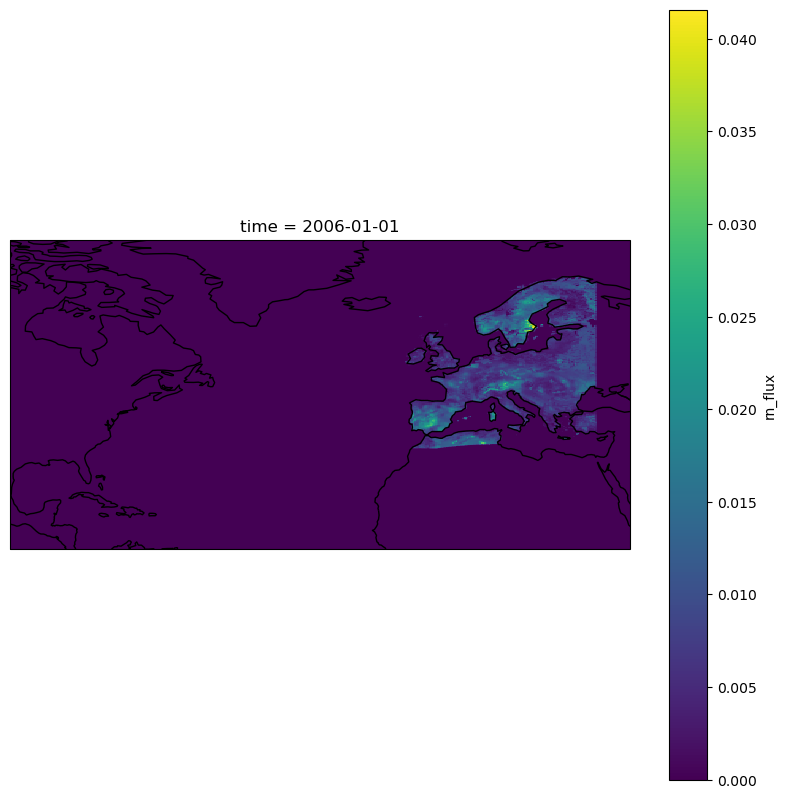

In [32]:
# Plot the regridded radon flux
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ERA5_Regrid['rn_flux'].sel({"time": "2006-01-01"}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')
plt.show()

In [33]:
lon_diff1 = np.diff(ERA5_Regrid['lon'].values)[0]  # Assuming lon is regularly spaced
lat_diff1 = np.diff(ERA5_Regrid['lat'].values)[0]  # Assuming lat is regularly spaced

# Calculate the area of each grid cell
area_original1 = lon_diff1 * lat_diff1

# Repeat the same for the regridded dataset
lon_diff_regrid1 = np.diff(ERA5_Regrid['lon'].values)[0]
lat_diff_regrid1 = np.diff(ERA5_Regrid['lat'].values)[0]
area_regrid1 = lon_diff_regrid1 * lat_diff_regrid1

# Calculate the sum of flux times area for the original and regridded datasets
total_flux_original1 = np.nansum(ERA5_Regrid['rn_flux'].values * area_original1)
total_flux_regrid1 = np.nansum(ERA5_Regrid['rn_flux'].values * area_regrid1)

# Check if the total flux is conserved within a small tolerance
tolerance = 1e-6  #adjust this tolerance based on requirements
flux_conserved1 = np.isclose(total_flux_original1, total_flux_regrid1, atol=tolerance)

if flux_conserved:
    print("Total flux is conserved after regridding.")
else:
    print("Total flux is not conserved after regridding.")

Total flux is conserved after regridding.


In [34]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\R_traceRadon_rnflux_GLDAS-Noah_day_2022_v0.6_regrid.nc') as f:
    GLDAS_regridded = f.load()

In [35]:
GLDAS_regridded

<xarray.Dataset>
Dimensions:  (time: 365, lat: 293, lon: 391)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-02 ... 2022-12-31
  * lon      (lon) float32 -97.9 -97.55 -97.2 -96.84 ... 38.32 38.68 39.03 39.38
  * lat      (lat) float32 10.73 10.96 11.2 11.43 ... 78.36 78.59 78.82 79.06
Data variables:
    rn_flux  (time, lat, lon) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes: (12/18)
    title:                      traceRadon radon flux map for Europe (based o...
    comment:                    Regridded to the UoB NAME footprint grid usin...
    creator:                    Ute Karstens, ICOS ERIC - Carbon Portal,  orc...
    institution:                ICOS ERIC - Carbon Portal, Physical Geography...
    project:                    19ENV01 traceRadon, EMPIR programme
    contact:                    Ute Karstens, ICOS ERIC - Carbon Portal, ute....
    ...                         ...
    crs:                        spherical earth with radius of 6367.47 km
    geospatial_lat_resolution:  0.05 degree
    geospatial_lon_resolution:  0.05 degree
    frequency:                  day
    summary:                    Daily radon flux map based on soil uranium co...
    regridded by:               Matt Rigby

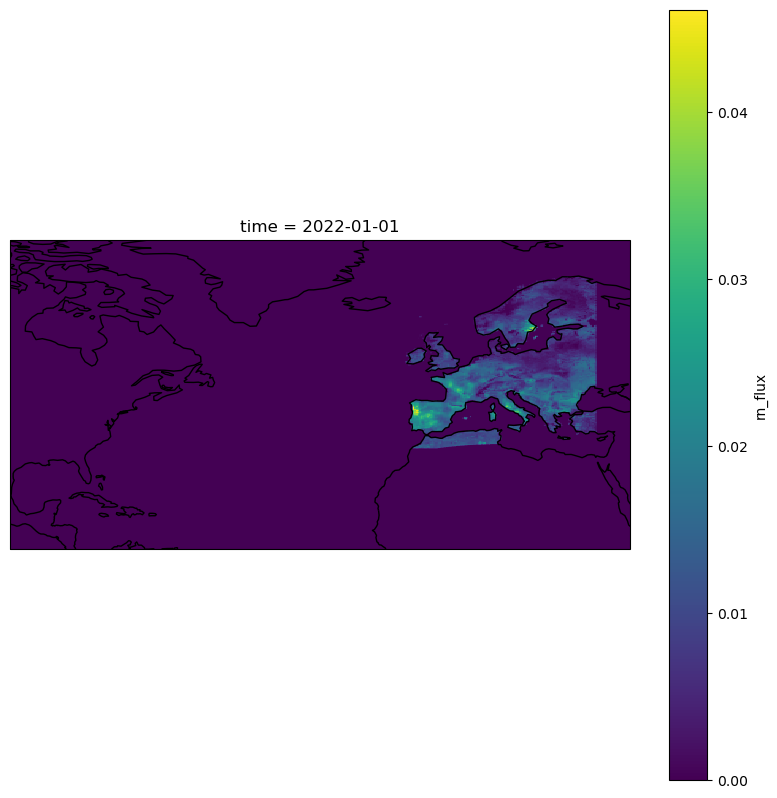

In [36]:
# Plot the regridded radon flux
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
GLDAS_regridded['rn_flux'].sel({"time": "2022-01-01"}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')
plt.show()

In [37]:
lon_diff2 = np.diff(GLDAS_regridded['lon'].values)[0]  # Assuming lon is regularly spaced
lat_diff2 = np.diff(GLDAS_regridded['lat'].values)[0]  # Assuming lat is regularly spaced

# Calculate the area of each grid cell
area_original2 = lon_diff2 * lat_diff2

# Repeat the same for the regridded dataset
lon_diff_regrid2 = np.diff(GLDAS_regridded['lon'].values)[0]
lat_diff_regrid2 = np.diff(GLDAS_regridded['lat'].values)[0]
area_regrid2 = lon_diff_regrid2 * lat_diff_regrid2

# Calculate the sum of flux times area for the original and regridded datasets
total_flux_original2 = np.nansum(GLDAS_regridded['rn_flux'].values * area_original2)
total_flux_regrid2 = np.nansum(GLDAS_regridded['rn_flux'].values * area_regrid2)

# Check if the total flux is conserved within a small tolerance
tolerance = 1e-6  #adjust this tolerance based on requirements
flux_conserved2 = np.isclose(total_flux_original2, total_flux_regrid2, atol=tolerance)

if flux_conserved:
    print("Total flux is conserved after regridding.")
else:
    print("Total flux is not conserved after regridding.")

Total flux is conserved after regridding.


## Reindexing

ERA5 Dataset

In [38]:
with xr.open_dataset(r"C:\Users\wilse\Documents\Final_project\R_traceRadon_rnflux_ERA5-Land_month_2006-2022_v0.6_regrid (1).nc") as f:
    ds_flux_ERA5 = f.load()

In [39]:
ds_flux_ERA5

<xarray.Dataset>
Dimensions:  (time: 204, lat: 293, lon: 391)
Coordinates:
  * time     (time) datetime64[ns] 2006-01-01 2006-02-01 ... 2022-12-01
  * lon      (lon) float32 -97.9 -97.55 -97.2 -96.84 ... 38.32 38.68 39.03 39.38
  * lat      (lat) float32 10.73 10.96 11.2 11.43 ... 78.36 78.59 78.82 79.06
Data variables:
    rn_flux  (time, lat, lon) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes: (12/18)
    title:                      traceRadon radon flux map for Europe (based o...
    comment:                    Regridded to the UoB NAME footprint grid usin...
    creator:                    Ute Karstens, ICOS ERIC - Carbon Portal,  orc...
    institution:                ICOS ERIC - Carbon Portal, Physical Geography...
    project:                    19ENV01 traceRadon, EMPIR programme
    contact:                    Ute Karstens, ICOS ERIC - Carbon Portal, ute....
    ...                         ...
    crs:                        spherical earth with radius of 6367.47 km
    geospatial_lat_resolution:  0.05 degree
    geospatial_lon_resolution:  0.05 degree
    frequency:                  mon
    summary:                    Monthly radon flux map based on soil uranium ...
    regridded by:               Matt Rigby

In [40]:
ds_flux_ERA5.rn_flux.attrs

{}

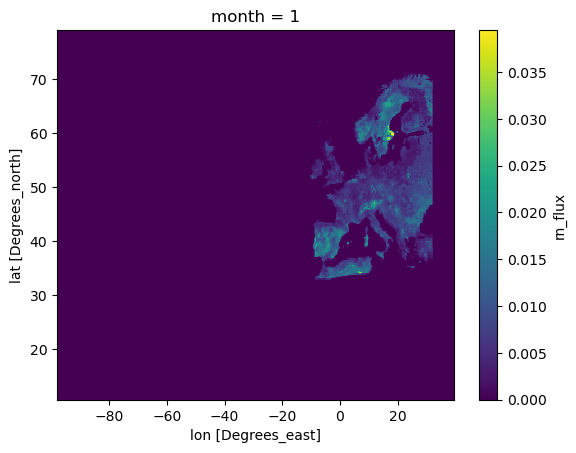

Text(0, 0.5, 'Rn flux ($\\times$ 100 Bq/m$^2$/s)')

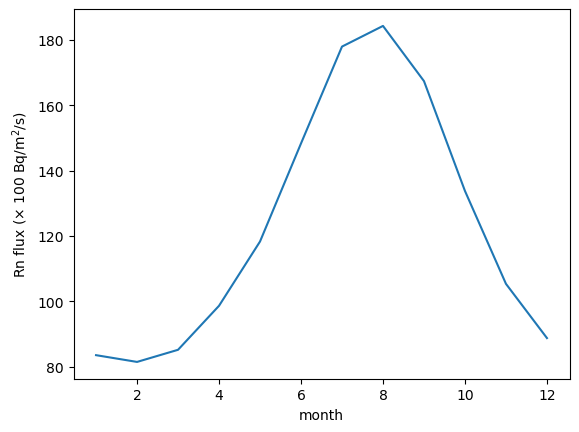

In [41]:
# Calculate monthly climatology
ds_flux_climatology_monthly_ERA5 = ds_flux_ERA5.groupby('time.month').mean('time')

# Plot one month
ds_flux_climatology_monthly_ERA5.sel(month=1).rn_flux.plot()
plt.show()

# Plot total annual flux as a timeseries (note that the sum done in this way doesn't really make any sense as you'd need to weight by area. 
# It's just to produce a quick plot)
ds_flux_climatology_monthly_ERA5.rn_flux.sum(dim=["lon", "lat"]).plot()
#plt.ylabel('Rn flux (Bq/m^2/s)')
plt.ylabel(r'Rn flux ($\times$ 100 Bq/m$^2$/s)')

In [42]:
# Create an empty flux dataset for the years 2020 - 2024, monthly resolution
ds_flux_2020_2024 = ds_flux_ERA5.isel(time=0)

# Extend the time dimension to 2020 - 2024
ds_flux_2020_2024 = ds_flux_2020_2024.expand_dims(time=pd.date_range(start='2020-01-01', end='2024-12-31', freq='M'))

# Create a new DataArray to hold the updated data
rn_flux_updated = xr.DataArray(
    data=np.empty_like(ds_flux_2020_2024.rn_flux),  # create an empty array with the same shape
    coords=ds_flux_2020_2024.rn_flux.coords,  # use the same coordinates
    dims=ds_flux_2020_2024.rn_flux.dims  # and the same dimensions
)

# Fill the new DataArray with the monthly climatology
for t in ds_flux_2020_2024.time:
    month = t.values.astype('datetime64[M]').astype(int) % 12 + 1
    rn_flux_updated.loc[dict(time=t)] = ds_flux_climatology_monthly_ERA5.sel(month=month).rn_flux.values

# Replace the old DataArray with the new one in the Dataset
ds_flux_2020_2024['rn_flux'] = rn_flux_updated

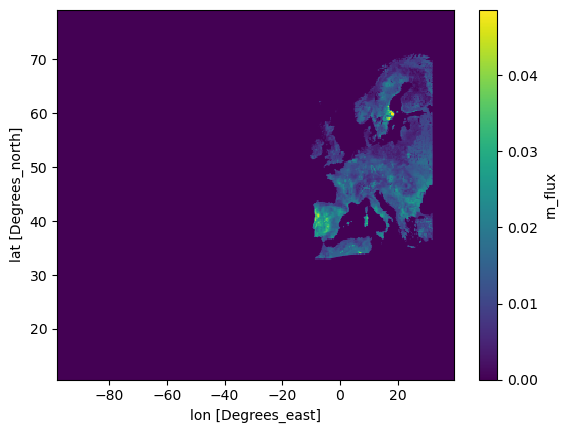

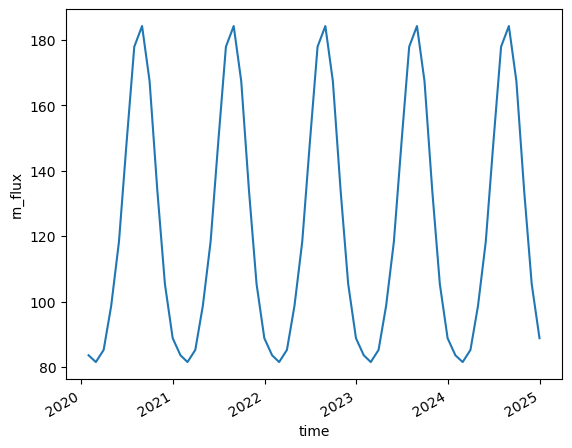

In [43]:
# Plot the updated timeseries
ds_flux_2020_2024.rn_flux.mean(dim=["time"]).plot()
plt.show()

ds_flux_2020_2024.rn_flux.sum(dim=["lon", "lat"]).plot()

In [44]:
ds_flux_climatology_monthly_ERA5

<xarray.Dataset>
Dimensions:  (month: 12, lat: 293, lon: 391)
Coordinates:
  * lon      (lon) float32 -97.9 -97.55 -97.2 -96.84 ... 38.32 38.68 39.03 39.38
  * lat      (lat) float32 10.73 10.96 11.2 11.43 ... 78.36 78.59 78.82 79.06
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    rn_flux  (month, lat, lon) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes: (12/18)
    title:                      traceRadon radon flux map for Europe (based o...
    comment:                    Regridded to the UoB NAME footprint grid usin...
    creator:                    Ute Karstens, ICOS ERIC - Carbon Portal,  orc...
    institution:                ICOS ERIC - Carbon Portal, Physical Geography...
    project:                    19ENV01 traceRadon, EMPIR programme
    contact:                    Ute Karstens, ICOS ERIC - Carbon Portal, ute....
    ...                         ...
    crs:                        spherical earth with radius of 6367.47 km
    geospatial_lat_resolution:  0.05 degree
    geospatial_lon_resolution:  0.05 degree
    frequency:                  mon
    summary:                    Monthly radon flux map based on soil uranium ...
    regridded by:               Matt Rigby

In [45]:
ds_flux_climatology_monthly_ERA5.rn_flux.attrs

{}

In [46]:
# Create a time range. Here, we'll just assume fluxes are constant for 10 years
nt = 60
time = pd.date_range(start='2020-01-31', periods=nt, freq='M')

# Repeat the flux variable nt times
flux1 = np.repeat(ds_flux_2020_2024.rn_flux.values[np.newaxis, :, :], nt, axis=0)

In [47]:
ds_flux_2020_2024

<xarray.Dataset>
Dimensions:  (time: 60, lat: 293, lon: 391)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-31 2020-02-29 ... 2024-12-31
  * lon      (lon) float32 -97.9 -97.55 -97.2 -96.84 ... 38.32 38.68 39.03 39.38
  * lat      (lat) float32 10.73 10.96 11.2 11.43 ... 78.36 78.59 78.82 79.06
Data variables:
    rn_flux  (time, lat, lon) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes: (12/18)
    title:                      traceRadon radon flux map for Europe (based o...
    comment:                    Regridded to the UoB NAME footprint grid usin...
    creator:                    Ute Karstens, ICOS ERIC - Carbon Portal,  orc...
    institution:                ICOS ERIC - Carbon Portal, Physical Geography...
    project:                    19ENV01 traceRadon, EMPIR programme
    contact:                    Ute Karstens, ICOS ERIC - Carbon Portal, ute....
    ...                         ...
    crs:                        spherical earth with radius of 6367.47 km
    geospatial_lat_resolution:  0.05 degree
    geospatial_lon_resolution:  0.05 degree
    frequency:                  mon
    summary:                    Monthly radon flux map based on soil uranium ...
    regridded by:               Matt Rigby

In [48]:
# Add flux and time dimension to ds_flux_climatology_monthly_ERA5
ds_flux_2020_2024 = ds_flux_2020_2024.assign({"month": time})
ds_flux_2020_2024 = ds_flux_2020_2024.assign({ "rn_flux": (("time", "month", "lat", "lon"), flux1)})

In [49]:
# Loop through each footprint element and multiply by the radon flux for the closest time point

# Create an empty array to hold the rn MOLE FRACTION
rn = np.empty(len(rgl_202011.time))

for i in range(len(rgl_202011.time)):
    # Find the closest time point in the radon flux dataset
    idx = np.argmin(np.abs(ds_flux_2020_2024.time.values - rgl_202011.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn[i] = np.sum((rgl_202011.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx))).values)

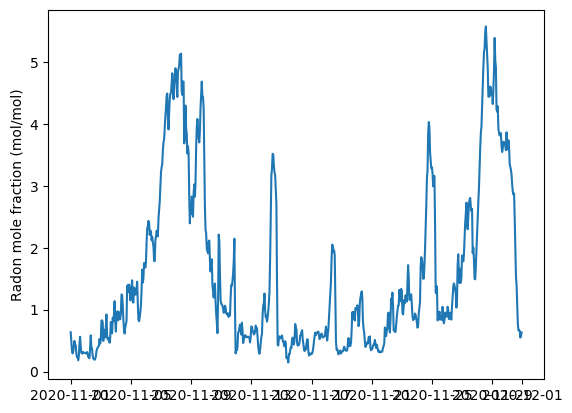

In [50]:
plt.plot(rgl_202011.time, rn)
plt.ylabel("Radon mole fraction (mol/mol)")
plt.show()

In [51]:
# Filter November 30th dates for each year
#november_30th_dates = ['2020-11-30']

# November 1st dates from fp file 
#november_1st_dates_fp = ['2020-11-01']

# Filter data for November 30th dates
#ds_flux_november_30th = ds_flux_2020_2024.sel(time=november_30th_dates)

# Filter for November 1st dates from fp file
#ds_fp_november_1st = rgl_202011.sel(time=november_1st_dates_fp)

# Reindex the filtered data against rgl_202011
#rn_model1_november_30th = (ds_flux_november_30th.rn_flux.reindex_like(ds_fp_november_1st, method="nearest") * ds_fp_november_1st.fp).sum(dim=["lat", "lon"])

# Want to select the fp that correspond to a single day 
# Looking to create con data for a single day 
# Do every day in every single month - for loop for each day in range 0,31 and work it up slowly to see the memory and then test that 
# Try and get a 24 point time series for any dat first 
# 


In [52]:
# Verify datetime format
#print(ds_flux_2020_2024.time)

# Sort datetime index if necessary
#ds_flux_2020_2024 = ds_flux_2020_2024.sortby('time')

# Loop over all days in November
#for day in range(1, 31):
 #   # Generate the date string
  #  date_str = f'2020-11-{day:02d}'  # Assuming 2020 is the year
    
    # Check if date_str exists in the datetime index
   # if date_str in ds_flux_2020_2024.time:
        # Filter data for the current day in November
    #    ds_flux_november_day = ds_flux_2020_2024.sel(time=date_str)
        
        # Filter for November 1st dates from fp file
     #   ds_fp_november_1st = rgl_202011.sel(time='2020-11-01')  # Assuming 2020 is the year
        
        # Reindex the filtered data against rgl_202011
      #  rn_model1_november_day = (ds_flux_november_day.rn_flux.reindex_like(ds_fp_november_1st, method="nearest") * ds_fp_november_1st.fp).sum(dim=["lat", "lon"])
    #else:
     #   print(f"Data not available for {date_str}")


# Think by the output, I am being dumb and using the wrong data set as there is only one entry per month and need at least one daily 

In [53]:
# Loop over all days in November
#for day in range(1, 31):
    # Generate the date string
 #   date_str = f'2022-11-{day:02d}'  # Assuming 2020 is the year
    
  #  try:
        # Slice ERA5_Regrid dataset to include only November 2020
   #     ds_era5_november_2020 = ds_flux_ERA5.sel(time=slice('2022-11-01', '2022-11-30'))
        
        # Filter data for the current day in November
    #    ds_era5_november_day = ds_era5_november_2020.sel(time=date_str)
        
        # Filter for November 1st dates from fp file
     #   ds_fp_november_1st = rgl_202011.sel(time='2022-11-01')  # Assuming 2020 is the year
        
        # Reindex the filtered data against rgl_202011
      #  rn_model1_november_day = (ds_era5_november_day.rn_flux.reindex_like(ds_fp_november_1st, method="nearest") * ds_fp_november_1st.fp).sum(dim=["lat", "lon"])
    #except KeyError:
       # print(f"Data not available for {date_str}")

In [54]:
#rn_model1 = (ds_flux_2020_2024.rn_flux.reindex_like(rgl_202011.time, method="nearest") * rgl_202011.fp).sum(dim=["lat", "lon"])

In [55]:
#Only need to do this to the fp files? Dont think I need it for the fluxes
#def convert_to_bq_per_m3(data, half_life_days=3.8):
    # Assuming 1 mol of radon-222 produces 6.022e23 decays (Avogadro's number)
 #   avogadro_number = 6.022e23
    
    # Convert half-life to seconds
  #  half_life_seconds = half_life_days * 24 * 60 * 60
    
    # Calculate decay constant
   # decay_constant = np.log(2) / half_life_seconds
    
    # Convert mol/mol to Bq/m^3
    # Bq = (Activity constant) * (Number of moles)
    # Activity constant = (Avogadro's number) * (decay constant)
    #activity_constant = avogadro_number * decay_constant
    #bq_per_m3 = data * activity_constant
    
    #return bq_per_m3

# usage
#data = rn_model1_november_30th 
#converted_data = convert_to_bq_per_m3(data)

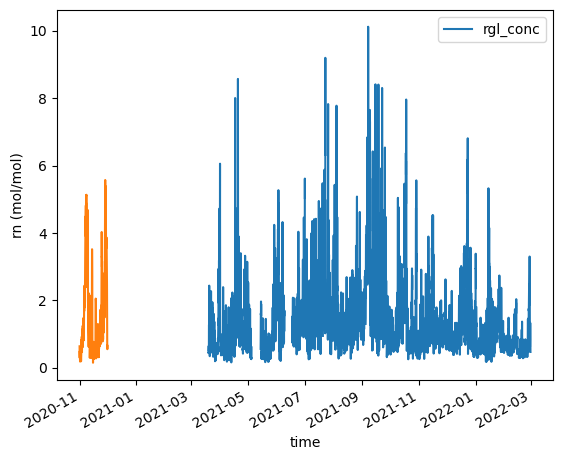

In [56]:
rgl_conc.radon.plot(label='rgl_conc')
plt.plot(rgl_202011.time, rn)
plt.ylabel("rn (mol/mol)")
plt.legend()
plt.show()

In [57]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202103.nc') as f:
    rgl_202103 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202106.nc') as f:
    rgl_202106 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202109.nc') as f:
    rgl_202109 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202112.nc') as f:
    rgl_202112 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202101.nc') as f:
    rgl_202101 = f.load()
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202102.nc') as f:
    rgl_202102 = f.load()
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202104.nc') as f:
    rgl_202104 = f.load()
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202105.nc') as f:
    rgl_202105 = f.load()
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202107.nc') as f:
    rgl_202107 = f.load()
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202108.nc') as f:
    rgl_202108 = f.load()
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202110.nc') as f:
    rgl_202110 = f.load()
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\RGL-90magl_UKV_rn_EUROPE_202111.nc') as f:
    rgl_202111 = f.load()

In [58]:
#Grouping together to get rid of the mess 
# Loop through each footprint element and multiply by the radon flux for the closest time point

# Feb has the lowest radon emissions 
rn_feb21 = np.empty(len(rgl_202102.time))

for i in range(len(rgl_202102.time)):
    # Find the closest time point in the radon flux dataset
    idx_feb = np.argmin(np.abs(ds_flux_2020_2024.time.values - rgl_202102.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_feb21[i] = np.sum((rgl_202102.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_feb))).values)

# Create an empty array to hold the rn MOLE FRACTION
rn_mar21 = np.empty(len(rgl_202103.time))

for i in range(len(rgl_202103.time)):
    # Find the closest time point in the radon flux dataset
    idx2 = np.argmin(np.abs(ds_flux_2020_2024.time.values - rgl_202103.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_mar21[i] = np.sum((rgl_202103.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx2))).values)

# Create an empty array to hold the rn MOLE FRACTION
rn_jun21 = np.empty(len(rgl_202106.time))

for i in range(len(rgl_202106.time)):
    # Find the closest time point in the radon flux dataset
    idx1 = np.argmin(np.abs(ds_flux_2020_2024.time.values - rgl_202106.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_jun21[i] = np.sum((rgl_202106.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx1))).values)

#Create an empty array 
rn_aug21 = np.empty(len(rgl_202108.time))

# August as it is the warmest month and seems to be when the least amount of radon is emitted 
for i in range(len(rgl_202108.time)):
    # Find the closest time point in the radon flux dataset
    idx_aug = np.argmin(np.abs(ds_flux_2020_2024.time.values - rgl_202108.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_aug21[i] = np.sum((rgl_202108.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_aug))).values)

# Create an empty array to hold the rn MOLE FRACTION
rn_sep21 = np.empty(len(rgl_202109.time))

for i in range(len(rgl_202109.time)):
    # Find the closest time point in the radon flux dataset
    idx = np.argmin(np.abs(ds_flux_2020_2024.time.values - rgl_202109.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_sep21[i] = np.sum((rgl_202109.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx))).values)

# Create an empty array to hold the rn MOLE FRACTION
rn_dec21 = np.empty(len(rgl_202112.time))

for i in range(len(rgl_202112.time)):
    # Find the closest time point in the radon flux dataset
    idx3 = np.argmin(np.abs(ds_flux_2020_2024.time.values - rgl_202112.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_dec21[i] = np.sum((rgl_202112.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx3))).values)

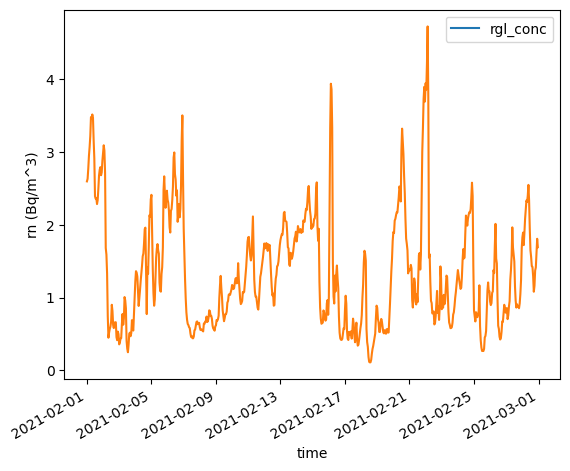

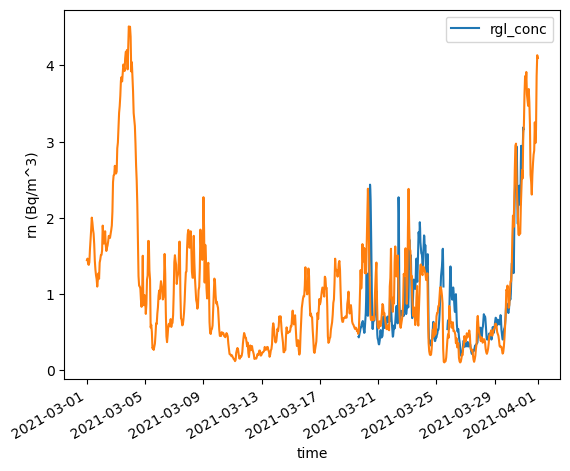

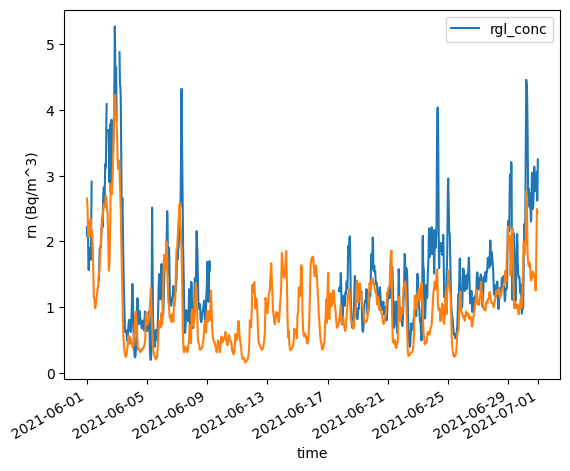

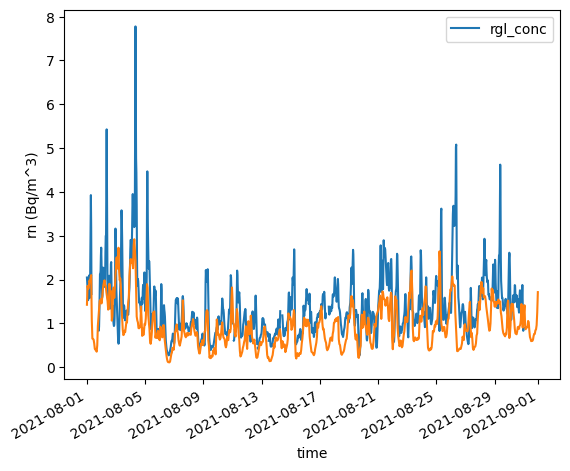

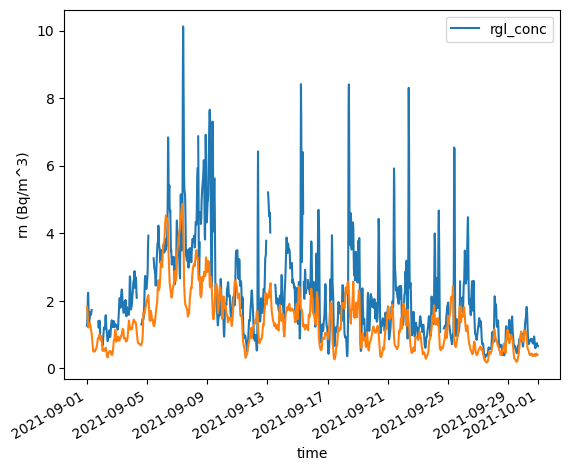

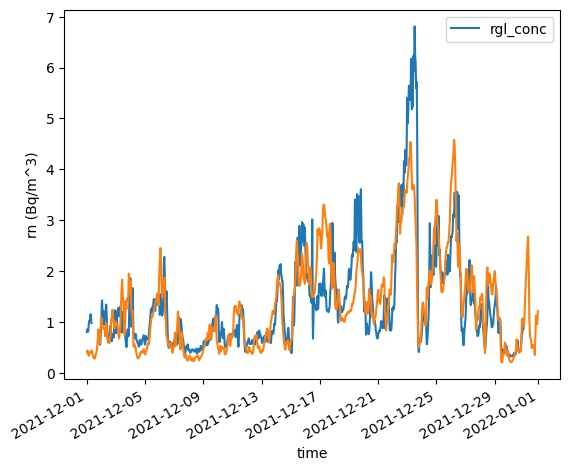

In [59]:
# Filter rgl_conc data for Feb 2021
rgl_conc_feb21 = rgl_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Plotting
rgl_conc_feb21.radon.plot(label='rgl_conc')
plt.plot(rgl_202102.time, rn_feb21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

# Filter rgl_conc data for March 2021
rgl_conc_mar21 = rgl_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Plotting
rgl_conc_mar21.radon.plot(label='rgl_conc')
plt.plot(rgl_202103.time, rn_mar21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

# Filter rgl_conc data for June 2021
rgl_conc_Jun21 = rgl_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Plotting
rgl_conc_Jun21.radon.plot(label='rgl_conc')
plt.plot(rgl_202106.time, rn_jun21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

# Filter rgl_conc data for March 2021
rgl_conc_aug21 = rgl_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Plotting
rgl_conc_aug21.radon.plot(label='rgl_conc')
plt.plot(rgl_202108.time, rn_aug21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

# Filter rgl_conc data for Sept 2021
rgl_conc_nov21 = rgl_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Plotting
rgl_conc_nov21.radon.plot(label='rgl_conc')
plt.plot(rgl_202109.time, rn_sep21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

# Filter rgl_conc data for December
rgl_conc_dec21 = rgl_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Plotting
rgl_conc_dec21.radon.plot(label='rgl_conc')
plt.plot(rgl_202112.time, rn_dec21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

In [60]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-ceda-20231103.nc') as f:
    tac_conc = f.load()

In [61]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202103.nc') as f:
    tac_202103 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202106.nc') as f:
    tac_202106 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202109.nc') as f:
    tac_202109 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202112.nc') as f:
    tac_202112 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202101.nc') as f:
    tac_202101 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202102.nc') as f:
    tac_202102 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202108.nc') as f:
    tac_202108 = f.load()

with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\TAC-185magl_UKV_rn_EUROPE_202111.nc') as f:
    tac_202111 = f.load()

In [62]:
# Loop through each footprint element and multiply by the radon flux for the closest time point

# feb has lowest emission of radon 
# Create an empty array to hold the rn MOLE FRACTION
tac_feb21 = np.empty(len(tac_202102.time))

for i in range(len(tac_202102.time)):
    # Find the closest time point in the radon flux dataset
    idx_tac_feb = np.argmin(np.abs(ds_flux_2020_2024.time.values - tac_202102.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_feb21[i] = np.sum((tac_202102.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_tac_feb))).values)

# Create an empty array to hold the rn MOLE FRACTION
tac_mar21 = np.empty(len(tac_202103.time))

for i in range(len(tac_202103.time)):
    # Find the closest time point in the radon flux dataset
    idx_tac1 = np.argmin(np.abs(ds_flux_2020_2024.time.values - tac_202103.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_mar21[i] = np.sum((tac_202103.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_tac1))).values)

#Going to do it all in one block so I dont have loads of stuff everywhere
# Create an empty array to hold the rn MOLE FRACTION
tac_jun21 = np.empty(len(tac_202106.time))

for i in range(len(tac_202106.time)):
    # Find the closest time point in the radon flux dataset
    idx_tac2 = np.argmin(np.abs(ds_flux_2020_2024.time.values - tac_202106.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_jun21[i] = np.sum((tac_202106.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_tac2))).values)

# August has the highest radon emissions 
tac_aug21 = np.empty(len(tac_202108.time))

for i in range(len(tac_202108.time)):
    # Find the closest time point in the radon flux dataset
    idx_tac_aug = np.argmin(np.abs(ds_flux_2020_2024.time.values - tac_202108.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_aug21[i] = np.sum((tac_202108.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_tac_aug))).values)

#September
# Create an empty array to hold the rn MOLE FRACTION
tac_sep21 = np.empty(len(tac_202109.time))

for i in range(len(tac_202109.time)):
    # Find the closest time point in the radon flux dataset
    idx_tac3 = np.argmin(np.abs(ds_flux_2020_2024.time.values - tac_202109.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_sep21[i] = np.sum((tac_202109.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_tac3))).values)

#December
# Create an empty array to hold the rn MOLE FRACTION
tac_dec21 = np.empty(len(tac_202112.time))

for i in range(len(tac_202112.time)):
    # Find the closest time point in the radon flux dataset
    idx_tac4 = np.argmin(np.abs(ds_flux_2020_2024.time.values - tac_202112.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_dec21[i] = np.sum((tac_202112.fp.isel(dict(time=i))).values * (ds_flux_2020_2024.rn_flux.isel(dict(time=idx_tac4))).values)

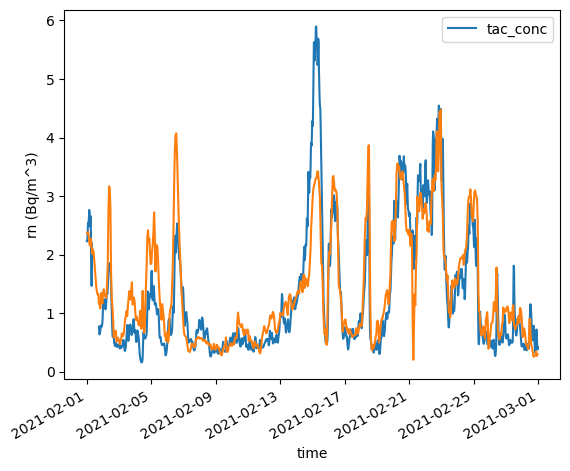

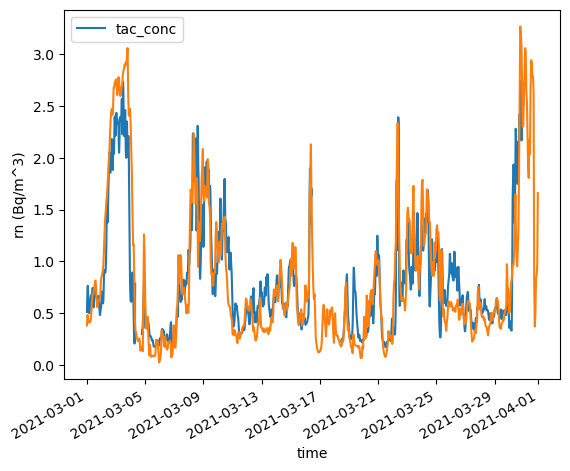

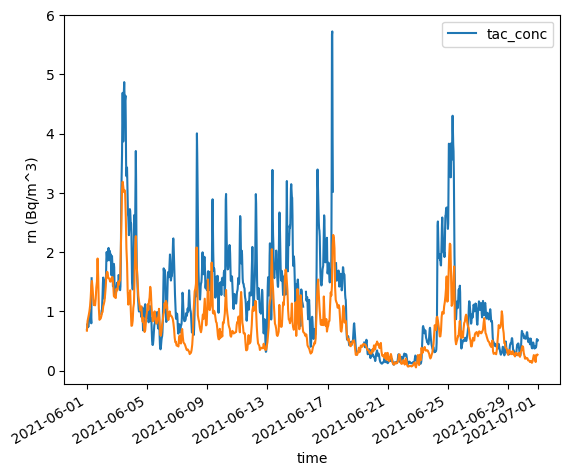

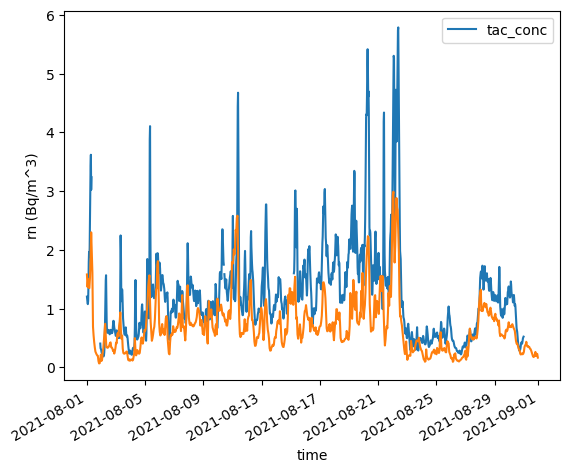

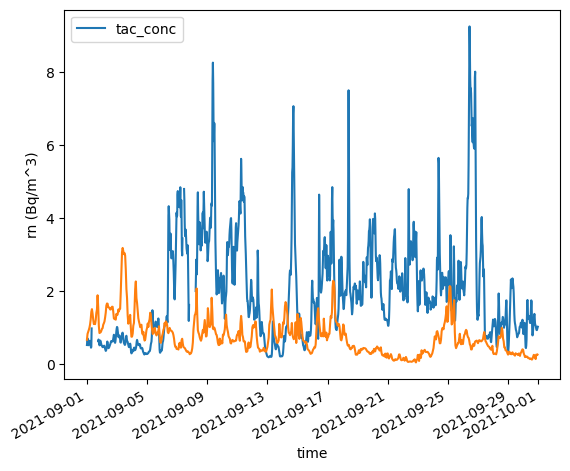

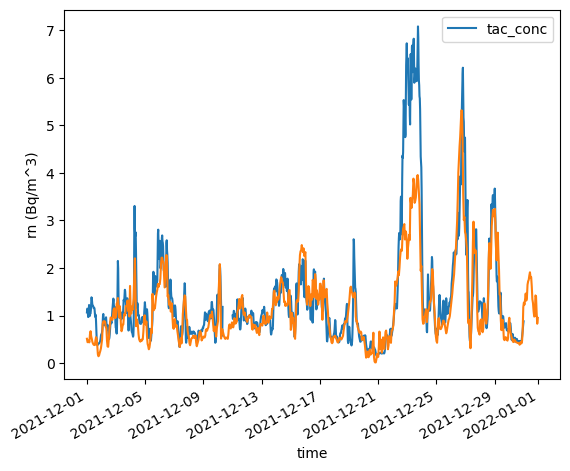

In [63]:
# Filter rgl_conc data for June 2021
tac_conc_feb21 = tac_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Plotting
tac_conc_feb21.radon.plot(label='tac_conc')
plt.plot(tac_202102.time, tac_feb21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

#March comparison
# Filter rgl_conc data for June 2021
tac_conc_mar21 = tac_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Plotting
tac_conc_mar21.radon.plot(label='tac_conc')
plt.plot(tac_202103.time, tac_mar21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

#June comparison 
# Filter rgl_conc data for June 2021
tac_conc_jun21 = tac_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Plotting
tac_conc_jun21.radon.plot(label='tac_conc')
plt.plot(tac_202106.time, tac_jun21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

# Filter rgl_conc data for June 2021
tac_conc_aug21 = tac_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Plotting
tac_conc_aug21.radon.plot(label='tac_conc')
plt.plot(tac_202108.time, tac_aug21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

# Sept comparison
# Filter rgl_conc data for June 2021
tac_conc_sep21 = tac_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Plotting
tac_conc_sep21.radon.plot(label='tac_conc')
plt.plot(tac_202109.time, tac_jun21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

#Dec comparison 
# Filter rgl_conc data for June 2021
tac_conc_dec21 = tac_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Plotting
tac_conc_dec21.radon.plot(label='tac_conc')
plt.plot(tac_202112.time, tac_dec21)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

GLDAS

In [64]:
with xr.open_dataset(r'C:\Users\wilse\Documents\Final_project\R_traceRadon_rnflux_GLDAS-Noah_day_2022_v0.6_regrid.nc') as f:
    gldas_rn = f.load()

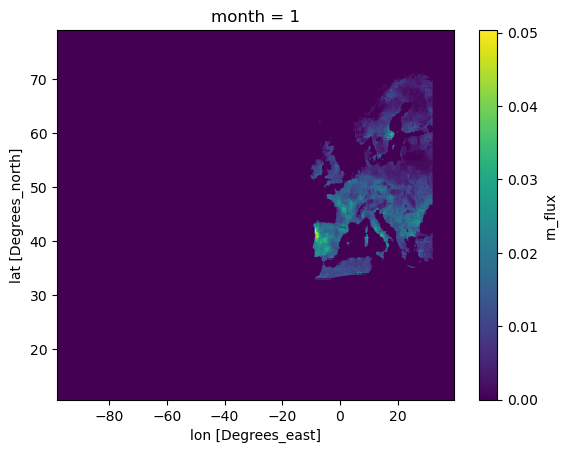

Text(0, 0.5, 'Rn flux ($\\times$ 100 Bq/m$^2$/s)')

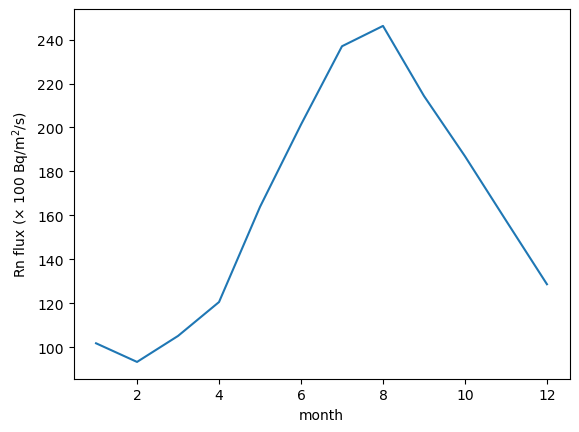

In [65]:
# Calculate monthly climatology
ds_flux_climatology_monthly_gldas = gldas_rn.groupby('time.month').mean('time')

# Plot one month
ds_flux_climatology_monthly_gldas.sel(month=1).rn_flux.plot()
plt.show()

# Plot total annual flux as a timeseries (note that the sum done in this way doesn't really make any sense as you'd need to weight by area. 
# It's just to produce a quick plot)
ds_flux_climatology_monthly_gldas.rn_flux.sum(dim=["lon", "lat"]).plot()
plt.ylabel(r'Rn flux ($\times$ 100 Bq/m$^2$/s)')

In [66]:
# Create an empty flux dataset for the years 2020 - 2024, monthly resolution
ds_flux_2020_2024_gldas = gldas_rn.isel(time=0)

# Extend the time dimension to 2020 - 2024
ds_flux_2020_2024_gldas = ds_flux_2020_2024_gldas.expand_dims(time=pd.date_range(start='2020-01-01', end='2024-12-31', freq='M'))

# Create a new DataArray to hold the updated data
rn_flux_updated_gldas = xr.DataArray(
    data=np.empty_like(ds_flux_2020_2024_gldas.rn_flux),  # create an empty array with the same shape
    coords=ds_flux_2020_2024_gldas.rn_flux.coords,  # use the same coordinates
    dims=ds_flux_2020_2024_gldas.rn_flux.dims  # and the same dimensions
)

# Fill the new DataArray with the monthly climatology
for t in ds_flux_2020_2024_gldas.time:
    month = t.values.astype('datetime64[M]').astype(int) % 12 + 1
    rn_flux_updated_gldas.loc[dict(time=t)] = ds_flux_climatology_monthly_gldas.sel(month=month).rn_flux.values

# Replace the old DataArray with the new one in the Dataset
ds_flux_2020_2024_gldas['rn_flux'] = rn_flux_updated_gldas

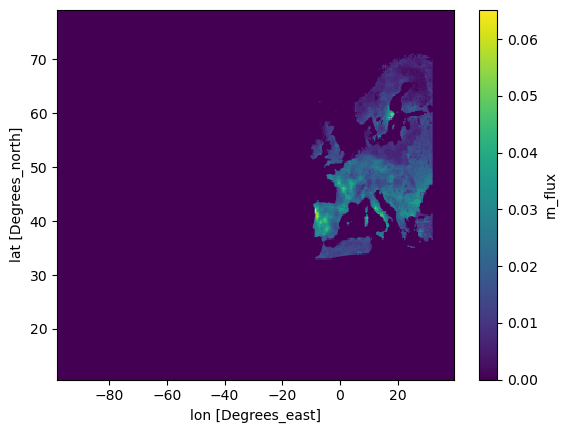

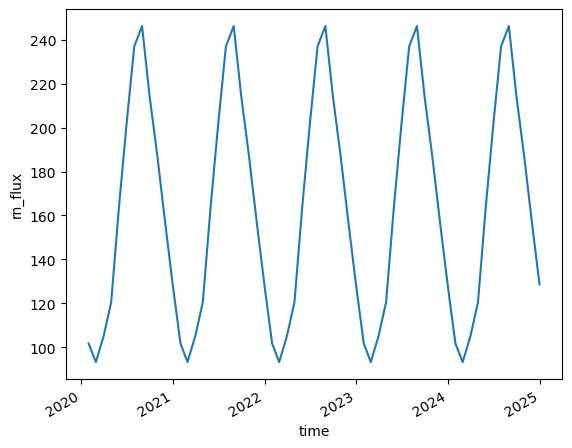

In [67]:
# Plot the updated timeseries
ds_flux_2020_2024_gldas.rn_flux.mean(dim=["time"]).plot()
plt.show()

ds_flux_2020_2024_gldas.rn_flux.sum(dim=["lon", "lat"]).plot()

In [68]:
# Create a time range. Here, we'll just assume fluxes are constant for 10 years
nt = 60
time = pd.date_range(start='2020-01-31', periods=nt, freq='M')

# Repeat the flux variable nt times
flux3 = np.repeat(ds_flux_2020_2024_gldas.rn_flux.values[np.newaxis, :, :], nt, axis=0)

In [69]:
# Add flux and time dimension to ds_flux_climatology_monthly_ERA5
ds_flux_2020_2024_gldas = ds_flux_2020_2024_gldas.assign({"month": time})
ds_flux_2020_2024_gldas = ds_flux_2020_2024_gldas.assign({ "rn_flux": (("time", "month", "lat", "lon"), flux3)})

In [70]:
# Loop through each footprint element and multiply by the radon flux for the closest time point

# Feb is still lowest emission of radon 
rn_gldas_feb = np.empty(len(rgl_202102.time))

for i in range(len(rgl_202102.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_feb = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - rgl_202102.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_gldas_feb[i] = np.sum((rgl_202102.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_feb))).values)


# Create an empty array to hold the rn MOLE FRACTION
rn_gldas_mar = np.empty(len(rgl_202103.time))

for i in range(len(rgl_202103.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_1 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - rgl_202103.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_gldas_mar[i] = np.sum((rgl_202103.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_1))).values)



#Jun
# Create an empty array to hold the rn MOLE FRACTION
rn_gldas_jun = np.empty(len(rgl_202106.time))

for i in range(len(rgl_202106.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_2 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - rgl_202106.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_gldas_jun[i] = np.sum((rgl_202106.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_2))).values)


# August is the highest emission of radon still 
rn_gldas_aug = np.empty(len(rgl_202108.time))

for i in range(len(rgl_202108.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_aug = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - rgl_202108.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_gldas_aug[i] = np.sum((rgl_202108.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_aug))).values)


# Sep
# Create an empty array to hold the rn MOLE FRACTION
rn_gldas_sep = np.empty(len(rgl_202109.time))

for i in range(len(rgl_202109.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_3 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - rgl_202109.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_gldas_sep[i] = np.sum((rgl_202109.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_3))).values)



#Dec
# Create an empty array to hold the rn MOLE FRACTION
rn_gldas_dec = np.empty(len(rgl_202112.time))

for i in range(len(rgl_202112.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_4 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - rgl_202112.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    rn_gldas_dec[i] = np.sum((rgl_202112.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_4))).values)

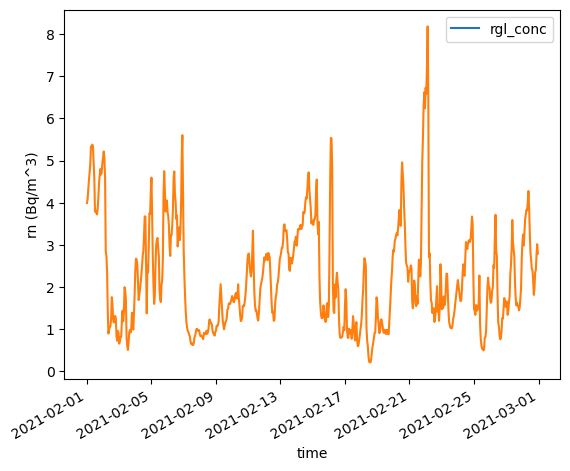

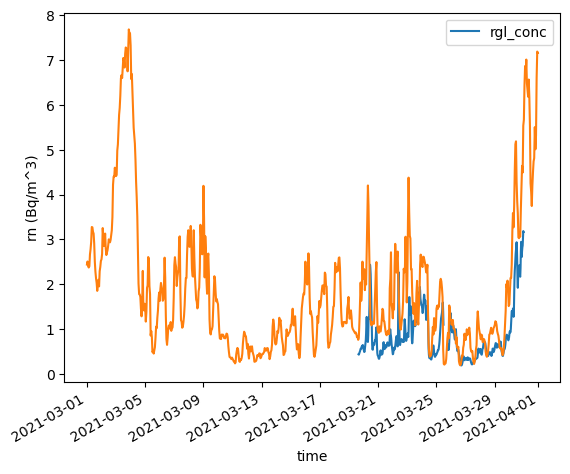

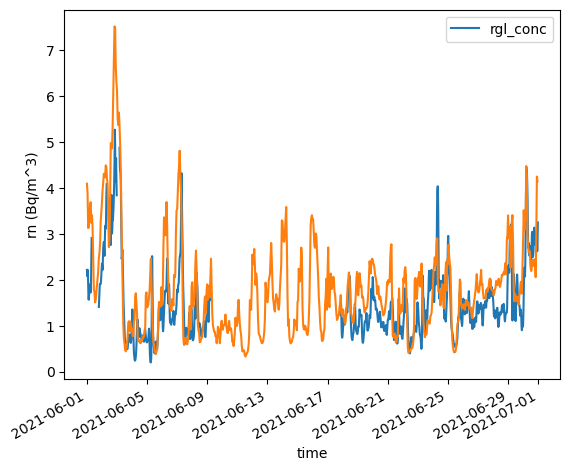

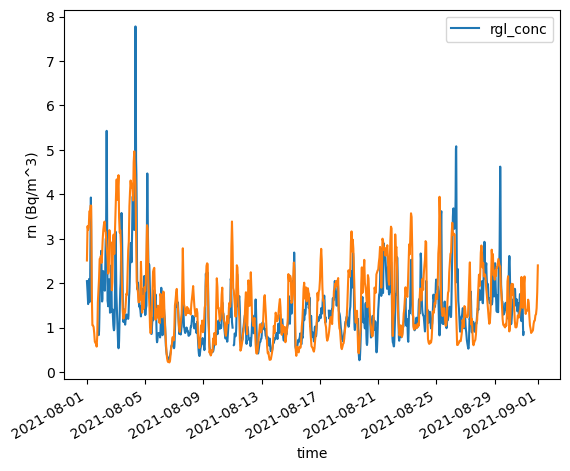

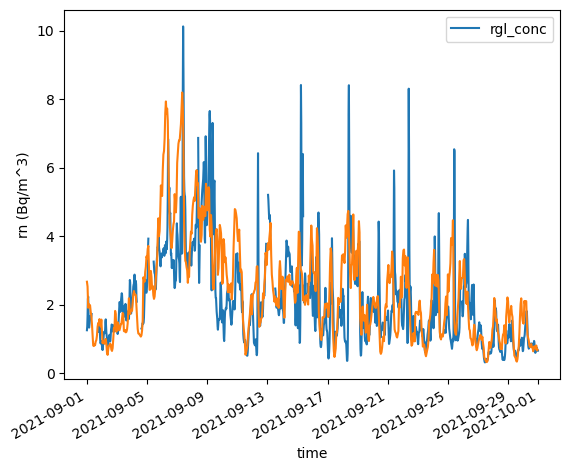

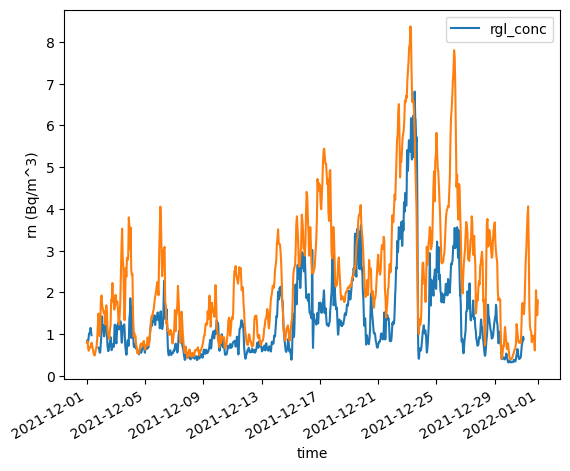

In [71]:
# Filter rgl_conc data for June 2021
rgl_conc_feb21_g = rgl_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Plotting
rgl_conc_feb21_g.radon.plot(label='rgl_conc')
plt.plot(rgl_202102.time, rn_gldas_feb)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

#mar comparison 
# Filter rgl_conc data for June 2021
rgl_conc_mar21_g = rgl_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Plotting
rgl_conc_mar21_g.radon.plot(label='rgl_conc')
plt.plot(rgl_202103.time, rn_gldas_mar)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()


#jun comparison 
# Filter rgl_conc data for June 2021
rgl_conc_jun21_g = rgl_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Plotting
rgl_conc_jun21_g.radon.plot(label='rgl_conc')
plt.plot(rgl_202106.time, rn_gldas_jun)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()


# Filter rgl_conc data for June 2021
rgl_conc_aug21_g = rgl_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Plotting
rgl_conc_aug21_g.radon.plot(label='rgl_conc')
plt.plot(rgl_202108.time, rn_gldas_aug)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

#sep comparison 
# Filter rgl_conc data for June 2021
rgl_conc_sep21_g = rgl_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Plotting
rgl_conc_sep21_g.radon.plot(label='rgl_conc')
plt.plot(rgl_202109.time, rn_gldas_sep)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()


#dec comparison 
# Filter rgl_conc data for June 2021
rgl_conc_dec21_g = rgl_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Plotting
rgl_conc_dec21_g.radon.plot(label='rgl_conc')
plt.plot(rgl_202112.time, rn_gldas_dec)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

In [72]:
# Loop through each footprint element and multiply by the radon flux for the closest time point

#feb
# Create an empty array to hold the rn MOLE FRACTION
tac_gldas_feb = np.empty(len(tac_202102.time))

for i in range(len(tac_202102.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_tfeb = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - tac_202102.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_gldas_feb[i] = np.sum((tac_202102.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_tfeb))).values)

# Create an empty array to hold the rn MOLE FRACTION
tac_gldas_mar = np.empty(len(tac_202103.time))

for i in range(len(tac_202103.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_5 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - tac_202103.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_gldas_mar[i] = np.sum((tac_202103.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_5))).values)



#Jun
# Create an empty array to hold the rn MOLE FRACTION
tac_gldas_jun = np.empty(len(tac_202106.time))

for i in range(len(tac_202106.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_6 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - tac_202106.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_gldas_jun[i] = np.sum((tac_202106.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_6))).values)


# August 
tac_gldas_aug = np.empty(len(tac_202108.time))

for i in range(len(tac_202108.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_taug = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - tac_202108.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_gldas_aug[i] = np.sum((tac_202108.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_taug))).values)


# Sep
# Create an empty array to hold the rn MOLE FRACTION
tac_gldas_sep = np.empty(len(tac_202109.time))

for i in range(len(tac_202109.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_7 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - tac_202109.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_gldas_sep[i] = np.sum((tac_202109.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_7))).values)



#Dec
# Create an empty array to hold the rn MOLE FRACTION
tac_gldas_dec = np.empty(len(tac_202112.time))

for i in range(len(tac_202112.time)):
    # Find the closest time point in the radon flux dataset
    idx_g_8 = np.argmin(np.abs(ds_flux_2020_2024_gldas.time.values - tac_202112.time.values[i]))
    # Multiply the footprint by the radon flux and sum over domain
    tac_gldas_dec[i] = np.sum((tac_202112.fp.isel(dict(time=i))).values * (ds_flux_2020_2024_gldas.rn_flux.isel(dict(time=idx_g_8))).values)

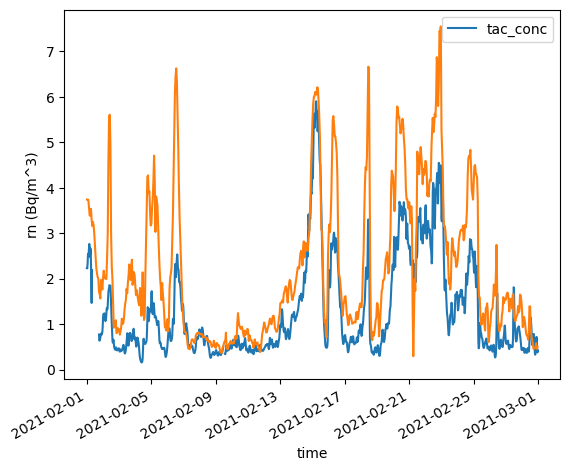

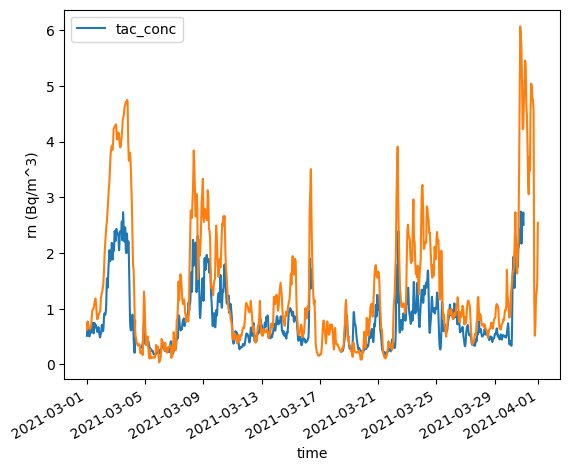

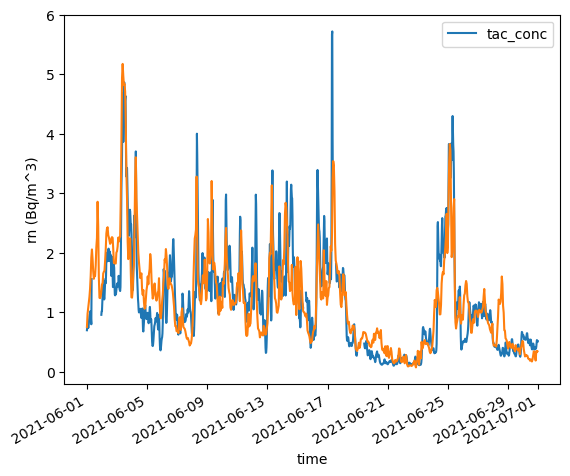

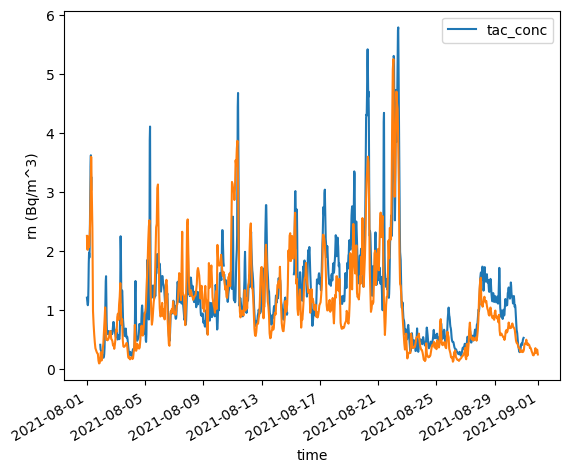

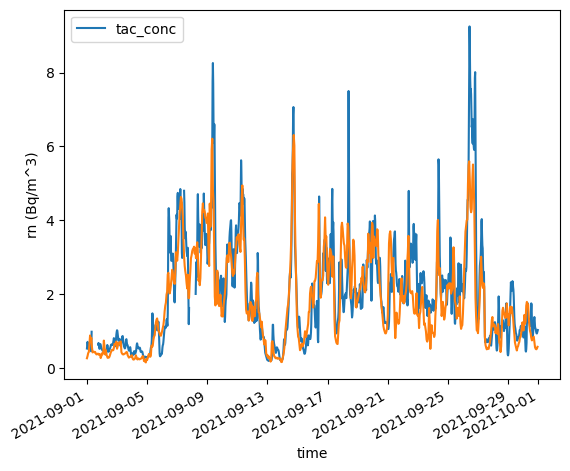

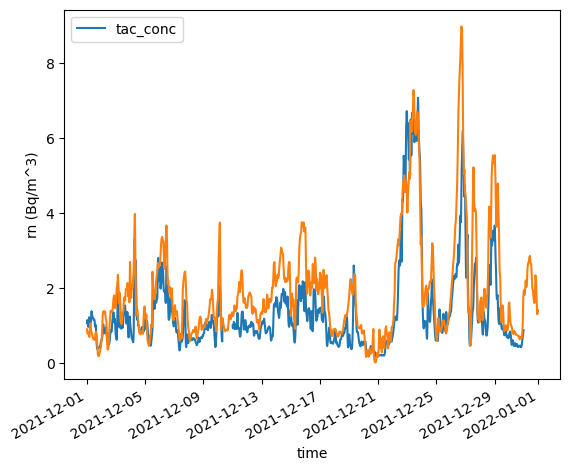

In [73]:
tac_conc_feb21_g = tac_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Plotting
tac_conc_feb21_g.radon.plot(label='tac_conc')
plt.plot(tac_202102.time, tac_gldas_feb)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

#mar comparison 
# Filter rgl_conc data for June 2021
tac_conc_mar21_g = tac_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Plotting
tac_conc_mar21_g.radon.plot(label='tac_conc')
plt.plot(tac_202103.time, tac_gldas_mar)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()


#jun comparison 
# Filter rgl_conc data for June 2021
tac_conc_jun21_g = tac_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Plotting
tac_conc_jun21_g.radon.plot(label='tac_conc')
plt.plot(tac_202106.time, tac_gldas_jun)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()


tac_conc_aug21_g = tac_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Plotting
tac_conc_aug21_g.radon.plot(label='tac_conc')
plt.plot(tac_202108.time, tac_gldas_aug)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

#sep comparison 
# Filter rgl_conc data for sep 2021
tac_conc_sep21_g = tac_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Plotting
tac_conc_sep21_g.radon.plot(label='tac_conc')
plt.plot(tac_202109.time, tac_gldas_sep)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()


#dec comparison 
# Filter rgl_conc data for dec 2021
tac_conc_dec21_g = tac_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Plotting
tac_conc_dec21_g.radon.plot(label='tac_conc')
plt.plot(tac_202112.time, tac_gldas_dec)
plt.ylabel("rn (Bq/m^3)")
plt.legend()
plt.show()

In [74]:
#Playing around with the correlation coefficient to see if I can come up with a quantitative analysis of how effective the model is 
#FEBRUARY
# RGLxERA5 - Looking at no correlation as there is no data 

# Access the specific variables you want to correlate
variable_rgl_era5 = rgl_conc_feb21["radon"].values
variable2_rgl_era5 = rn_feb21

# Check shapes and align arrays
if len(variable_rgl_era5) > len(variable2_rgl_era5):
    variable_rgl_era5 = variable_rgl_era5[:len(variable2_rgl_era5)]
elif len(variable2_rgl_era5) > len(variable_rgl_era5):
    variable2_rgl_era5 = np.interp(np.arange(len(variable_rgl_era5)), np.arange(len(variable2_rgl_era5)), variable2_rgl_era5)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_rgl_era5 = np.logical_and(~np.isnan(variable_rgl_era5), ~np.isnan(variable2_rgl_era5))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_rglera5 = variable_rgl_era5[nan_mask_rgl_era5]
variable2_cleaned_rglera5 = variable2_rgl_era5[nan_mask_rgl_era5]

# Select a matching subset of variable2 to correlate with variable
variable_subset_rglera5 = variable_cleaned_rglera5[:len(variable2_cleaned_rglera5)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef = np.corrcoef(variable2_cleaned_rglera5, variable_subset_rglera5)

# Print the correlation coefficient
print(cor_coef)

[[nan nan]
 [nan nan]]


c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\numpy\lib\function_base.py:2846: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\numpy\lib\function_base.py:2705: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
c:\Users\wilse\Miniconda3\envs\Conda_env\lib\site-packages\numpy\lib\function_base.py:2705: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


In [75]:
#RGLxGLDAS analysis 

# Access the specific variables you want to correlate
variable_rgl_gldas = rgl_conc_feb21_g["radon"].values
variable2_rgl_gldas = rn_gldas_feb

# Check shapes and align arrays
if len(variable_rgl_gldas) > len(variable2_rgl_gldas):
    variable_rgl_gldas = variable_rgl_gldas[:len(variable2_rgl_gldas)]
elif len(variable2_rgl_gldas) > len(variable_rgl_gldas):
    variable2_rgl_gldas = np.interp(np.arange(len(variable_rgl_gldas)), np.arange(len(variable2_rgl_gldas)), variable2_rgl_gldas)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_rgl_gldas = np.logical_and(~np.isnan(variable_rgl_gldas), ~np.isnan(variable2_rgl_gldas))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_rglgldas = variable_rgl_gldas[nan_mask_rgl_gldas]
variable2_cleaned_rglgldas = variable2_rgl_gldas[nan_mask_rgl_gldas]

# Select a matching subset of variable2 to correlate with variable
variable_subset_rglgldas = variable_cleaned_rglgldas[:len(variable2_cleaned_rglgldas)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef = np.corrcoef(variable2_cleaned_rglgldas, variable_subset_rglgldas)

# Print the correlation coefficient
print(cor_coef)

[[nan nan]
 [nan nan]]


In [76]:
# TACxERA5 

# Access the specific variables you want to correlate
variable_tac_era5 = tac_conc_feb21["radon"].values
variable2_tac_era5 = tac_feb21

# Check shapes and align arrays
if len(variable_tac_era5) > len(variable2_tac_era5):
    variable_tac_era5 = variable_tac_era5[:len(variable2_tac_era5)]
elif len(variable2_rgl_gldas) > len(variable_tac_era5):
    variable2_tac_era5 = np.interp(np.arange(len(variable_tac_era5)), np.arange(len(variable2_tac_era5)), variable2_tac_era5)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_tacera5 = np.logical_and(~np.isnan(variable_tac_era5), ~np.isnan(variable2_tac_era5))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_tacera5 = variable_tac_era5[nan_mask_tacera5]
variable2_cleaned_tacera5 = variable2_tac_era5[nan_mask_tacera5]

# Select a matching subset of variable2 to correlate with variable
variable_subset_tacera5 = variable_cleaned_tacera5[:len(variable2_cleaned_tacera5)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef = np.corrcoef(variable2_cleaned_tacera5, variable_subset_tacera5)

# Print the correlation coefficient
print(cor_coef)

[[ 1.         -0.26587628]
 [-0.26587628  1.        ]]


In [77]:
# TACxGLDAS

# Access the specific variables you want to correlate
variable_tac_gldas = tac_conc_feb21_g["radon"].values
variable2_tac_gldas = tac_gldas_feb

# Check shapes and align arrays
if len(variable_tac_gldas) > len(variable2_tac_gldas):
    variable_tac_gldas = variable_tac_gldas[:len(variable2_tac_gldas)]
elif len(variable2_tac_gldas) > len(variable_tac_gldas):
    variable2_tac_gldas = np.interp(np.arange(len(variable_tac_gldas)), np.arange(len(variable2_tac_gldas)), variable2_tac_gldas)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_tacgldas = np.logical_and(~np.isnan(variable_tac_gldas), ~np.isnan(variable2_tac_gldas))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_tacgldas = variable_tac_gldas[nan_mask_tacgldas]
variable2_cleaned_tacgldas = variable2_tac_gldas[nan_mask_tacgldas]

# Select a matching subset of variable2 to correlate with variable
variable_subset_tacgldas = variable_cleaned_tacgldas[:len(variable2_cleaned_tacgldas)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef = np.corrcoef(variable2_cleaned_tacgldas, variable_subset_tacgldas)

# Print the correlation coefficient
print(cor_coef)

[[ 1.         -0.27589003]
 [-0.27589003  1.        ]]


In [78]:
#AUGUST 
# RGLxERA5 - Looking at no correlation as there is no data 

# Access the specific variables you want to correlate
variable_rgl_era5_AUG = rgl_conc_aug21["radon"].values
variable2_rgl_era5_AUG = rn_aug21

# Check shapes and align arrays
if len(variable_rgl_era5_AUG) > len(variable2_rgl_era5_AUG):
    variable_rgl_era5_AUG = variable_rgl_era5_AUG[:len(variable2_rgl_era5_AUG)]
elif len(variable2_rgl_era5_AUG) > len(variable_rgl_era5_AUG):
    variable2_rgl_era5_AUG = np.interp(np.arange(len(variable_rgl_era5_AUG)), np.arange(len(variable2_rgl_era5_AUG)), variable2_rgl_era5_AUG)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_rgl_era5_AUG = np.logical_and(~np.isnan(variable_rgl_era5_AUG), ~np.isnan(variable2_rgl_era5_AUG))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_rglera5_AUG = variable_rgl_era5_AUG[nan_mask_rgl_era5_AUG]
variable2_cleaned_rglera5_AUG = variable2_rgl_era5_AUG[nan_mask_rgl_era5_AUG]

# Select a matching subset of variable2 to correlate with variable
variable_subset_rglera5_AUG = variable_cleaned_rglera5_AUG[:len(variable2_cleaned_rglera5_AUG)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef_RGLxERA5_AUG = np.corrcoef(variable2_cleaned_rglera5_AUG, variable_subset_rglera5_AUG)

# Print the correlation coefficient
print(cor_coef_RGLxERA5_AUG)

[[1.         0.05263091]
 [0.05263091 1.        ]]


In [79]:
#RGLxGLDAS analysis AUGUST

# Access the specific variables you want to correlate
variable_rgl_gldas_AUG = rgl_conc_aug21_g["radon"].values
variable2_rgl_gldas_AUG = rn_gldas_aug

# Check shapes and align arrays
if len(variable_rgl_gldas_AUG) > len(variable2_rgl_gldas_AUG):
    variable_rgl_gldas_AUG = variable_rgl_gldas_AUG[:len(variable2_rgl_gldas_AUG)]
elif len(variable2_rgl_gldas_AUG) > len(variable_rgl_gldas_AUG):
    variable2_rgl_gldas_AUG = np.interp(np.arange(len(variable_rgl_gldas_AUG)), np.arange(len(variable2_rgl_gldas_AUG)), variable2_rgl_gldas_AUG)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_rgl_gldas_AUG = np.logical_and(~np.isnan(variable_rgl_gldas_AUG), ~np.isnan(variable2_rgl_gldas_AUG))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_rglgldas_AUG = variable_rgl_gldas_AUG[nan_mask_rgl_gldas_AUG]
variable2_cleaned_rglgldas_AUG = variable2_rgl_gldas_AUG[nan_mask_rgl_gldas_AUG]

# Select a matching subset of variable2 to correlate with variable
variable_subset_rglgldas_AUG = variable_cleaned_rglgldas_AUG[:len(variable2_cleaned_rglgldas_AUG)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef_RGLxGLDAS_AUG = np.corrcoef(variable2_cleaned_rglgldas_AUG, variable_subset_rglgldas_AUG)

# Print the correlation coefficient
print(cor_coef_RGLxGLDAS_AUG)

[[1.         0.07894791]
 [0.07894791 1.        ]]


In [80]:
# TACxERA5 

# Access the specific variables you want to correlate
variable_tac_era5_AUG = tac_conc_aug21["radon"].values
variable2_tac_era5_AUG = tac_aug21

# Check shapes and align arrays
if len(variable_tac_era5_AUG) > len(variable2_tac_era5_AUG):
    variable_tac_era5_AUG = variable_tac_era5_AUG[:len(variable2_tac_era5_AUG)]
elif len(variable2_rgl_gldas_AUG) > len(variable_tac_era5_AUG):
    variable2_tac_era5_AUG = np.interp(np.arange(len(variable_tac_era5_AUG)), np.arange(len(variable2_tac_era5_AUG)), variable2_tac_era5_AUG)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_tacera5_AUG = np.logical_and(~np.isnan(variable_tac_era5_AUG), ~np.isnan(variable2_tac_era5_AUG))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_tacera5_AUG = variable_tac_era5_AUG[nan_mask_tacera5_AUG]
variable2_cleaned_tacera5_AUG = variable2_tac_era5_AUG[nan_mask_tacera5_AUG]

# Select a matching subset of variable2 to correlate with variable
variable_subset_tacera5_AUG = variable_cleaned_tacera5_AUG[:len(variable2_cleaned_tacera5_AUG)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef_TACxERA5_AUG = np.corrcoef(variable2_cleaned_tacera5_AUG, variable_subset_tacera5_AUG)

# Print the correlation coefficient
print(cor_coef_TACxERA5_AUG)

[[1.        0.0602612]
 [0.0602612 1.       ]]


In [81]:
# TACxGLDAS

# Access the specific variables you want to correlate
variable_tac_gldas_AUG = tac_conc_aug21_g["radon"].values
variable2_tac_gldas_AUG = tac_gldas_aug

# Check shapes and align arrays
if len(variable_tac_gldas_AUG) > len(variable2_tac_gldas_AUG):
    variable_tac_gldas_AUG = variable_tac_gldas_AUG[:len(variable2_tac_gldas_AUG)]
elif len(variable2_tac_gldas_AUG) > len(variable_tac_gldas_AUG):
    variable2_tac_gldas_AUG = np.interp(np.arange(len(variable_tac_gldas_AUG)), np.arange(len(variable2_tac_gldas_AUG)), variable2_tac_gldas_AUG)

# Create a mask to identify positions where NaN values exist in both datasets
nan_mask_tacgldas_AUG = np.logical_and(~np.isnan(variable_tac_gldas_AUG), ~np.isnan(variable2_tac_gldas_AUG))

# Apply the mask to both datasets to drop NaN values simultaneously
variable_cleaned_tacgldas_AUG = variable_tac_gldas_AUG[nan_mask_tacgldas_AUG]
variable2_cleaned_tacgldas_AUG = variable2_tac_gldas_AUG[nan_mask_tacgldas_AUG]

# Select a matching subset of variable2 to correlate with variable
variable_subset_tacgldas_AUG = variable_cleaned_tacgldas_AUG[:len(variable2_cleaned_tacgldas_AUG)]

# Calculate the correlation coefficient using np.corrcoef
cor_coef_TACxGLDAS_AUG = np.corrcoef(variable2_cleaned_tacgldas_AUG, variable_subset_tacgldas_AUG)

# Print the correlation coefficient
print(cor_coef_TACxGLDAS_AUG)

[[1.         0.04078496]
 [0.04078496 1.        ]]


Planetary boundary layer analysis

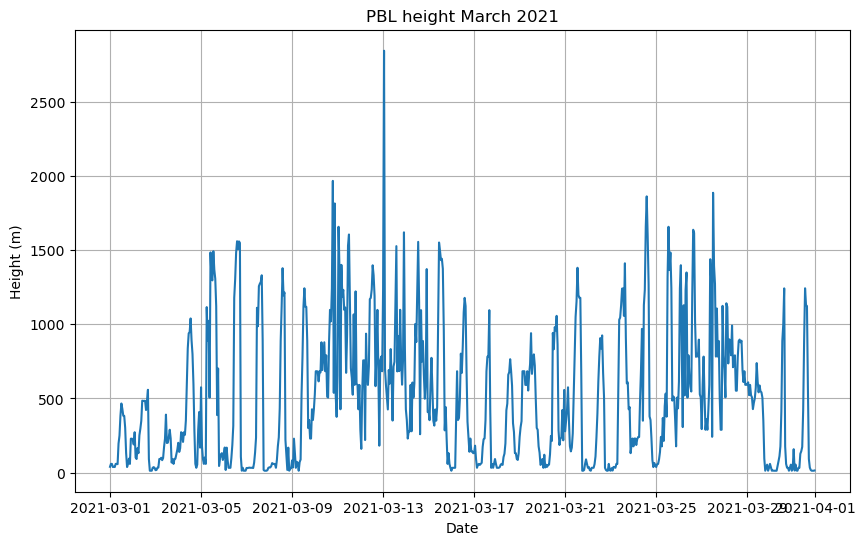

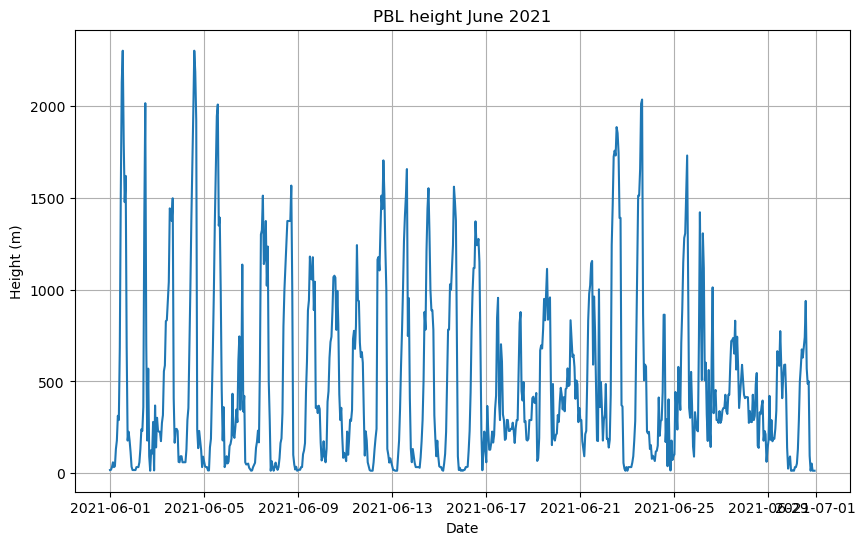

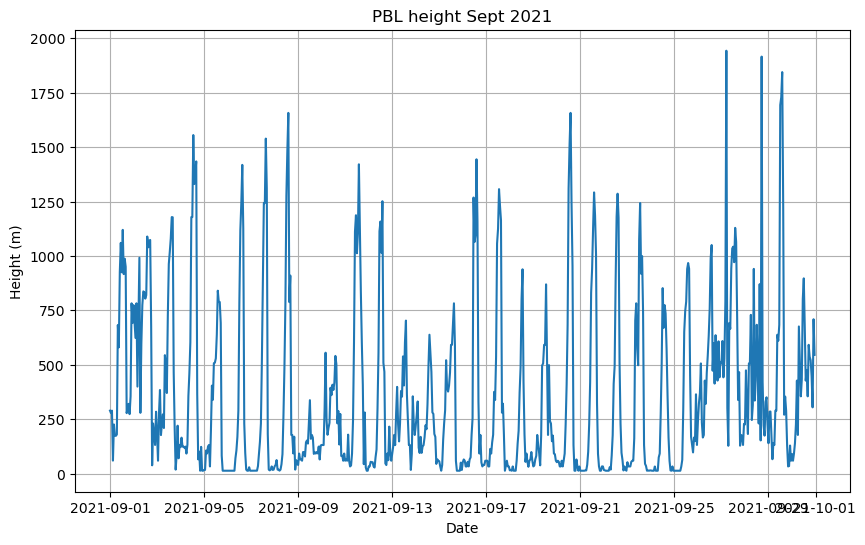

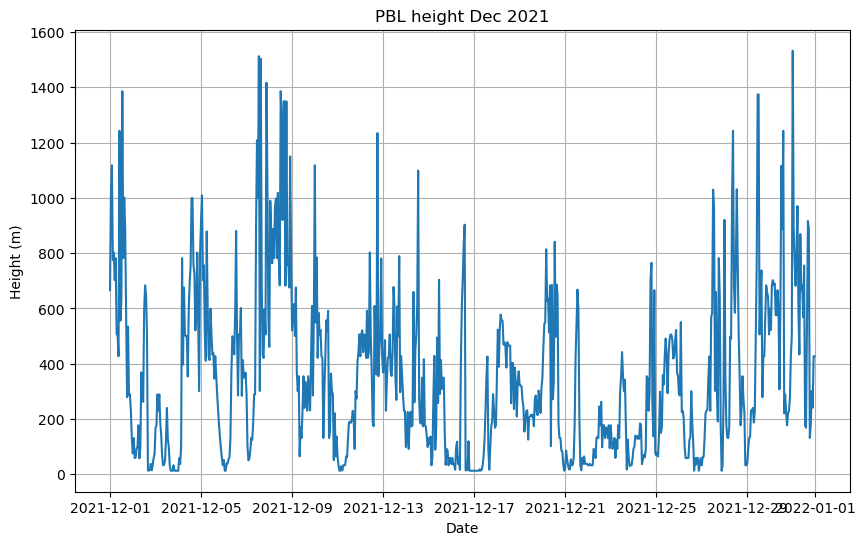

In [82]:
# Planetary boundary layer (PBL) height - Correlates to met data
plt.figure(figsize=(10, 6))
plt.plot(rgl_202103['time'], rgl_202103['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height March 2021')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 6))
plt.plot(rgl_202106['time'], rgl_202106['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height June 2021')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(rgl_202109['time'], rgl_202109['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height Sept 2021')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(rgl_202112['time'], rgl_202112['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height Dec 2021')
plt.grid(True)
plt.show()

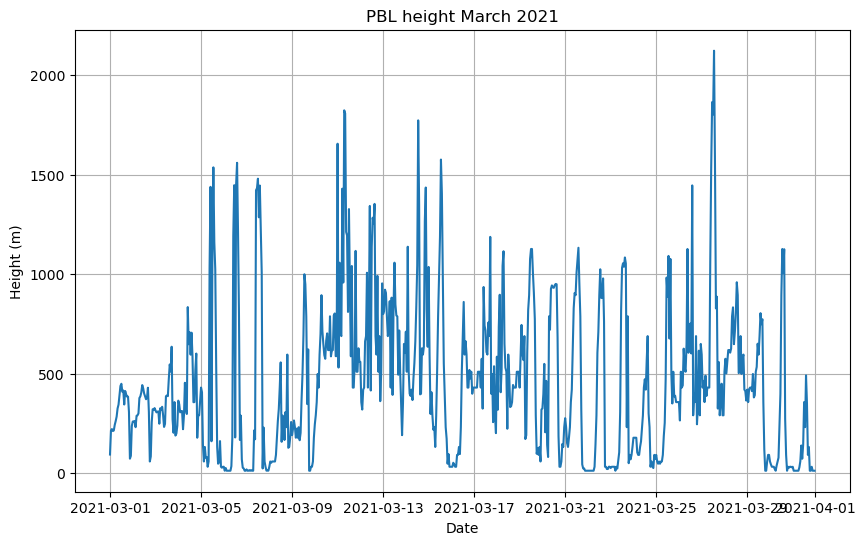

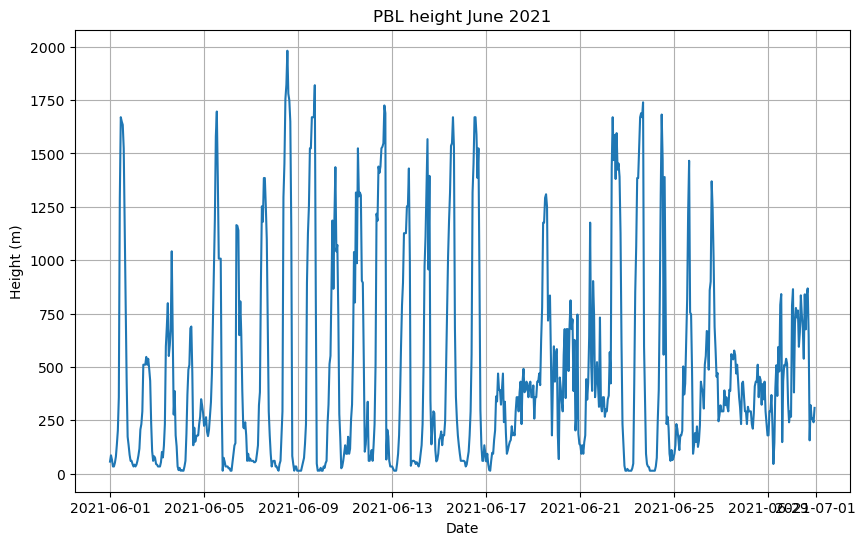

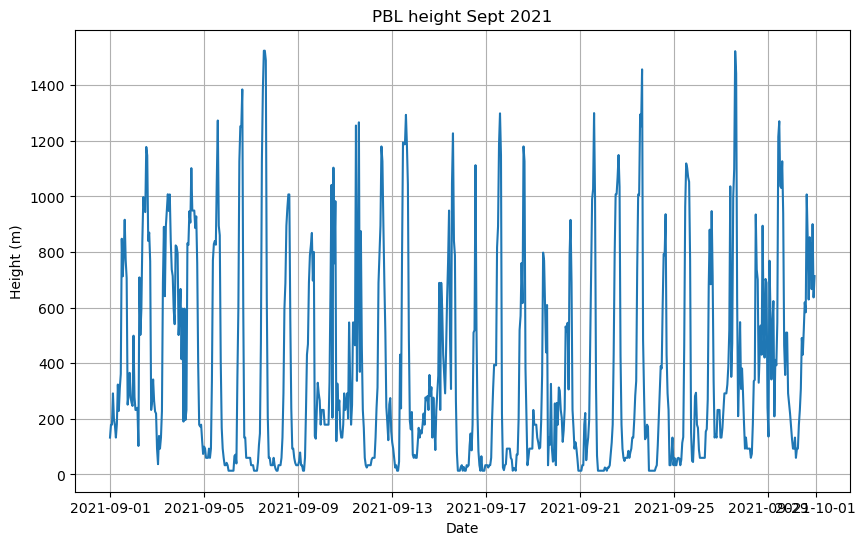

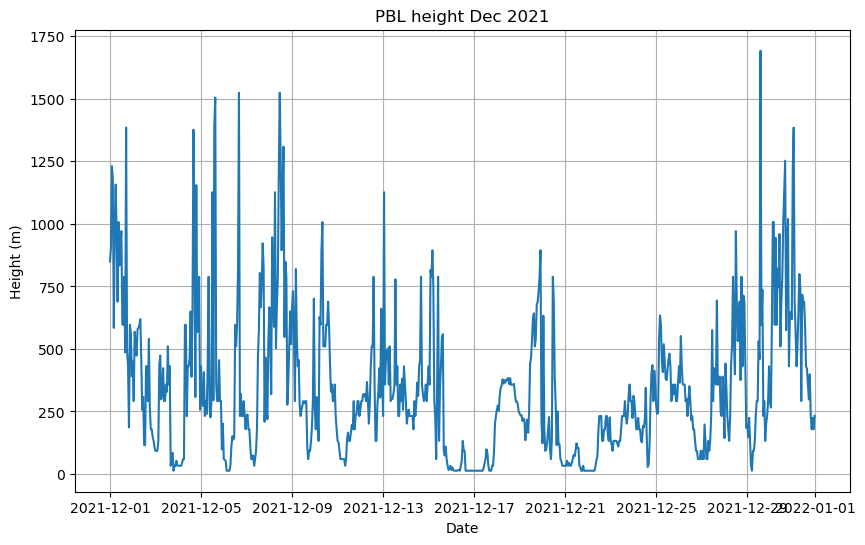

In [83]:
# Planetary boundary layer (PBL) height - Correlates to met data
plt.figure(figsize=(10, 6))
plt.plot(tac_202103['time'], tac_202103['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height March 2021')
plt.grid(True)
plt.show()


plt.figure(figsize=(10, 6))
plt.plot(tac_202106['time'], tac_202106['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height June 2021')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(tac_202109['time'], tac_202109['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height Sept 2021')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(tac_202112['time'], tac_202112['PBLH'])
plt.xlabel('Date')
plt.ylabel('Height (m)')
plt.title('PBL height Dec 2021')
plt.grid(True)
plt.show()

Comparison for results - RGL ERA5

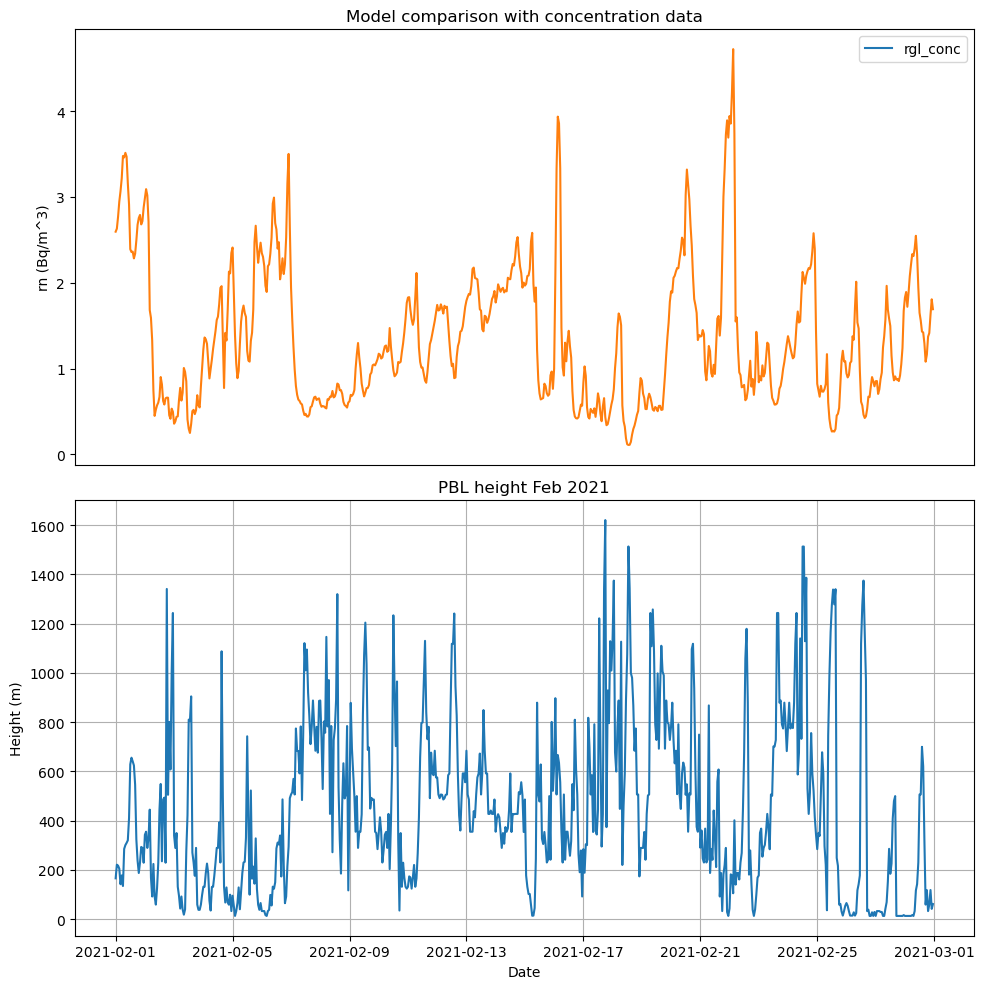

In [84]:
# Filter rgl_conc data for March 2021
rgl_conc_feb21 = rgl_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_conc_feb21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202102.time, rn_feb21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(rgl_202102['time'], rgl_202102['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Feb 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

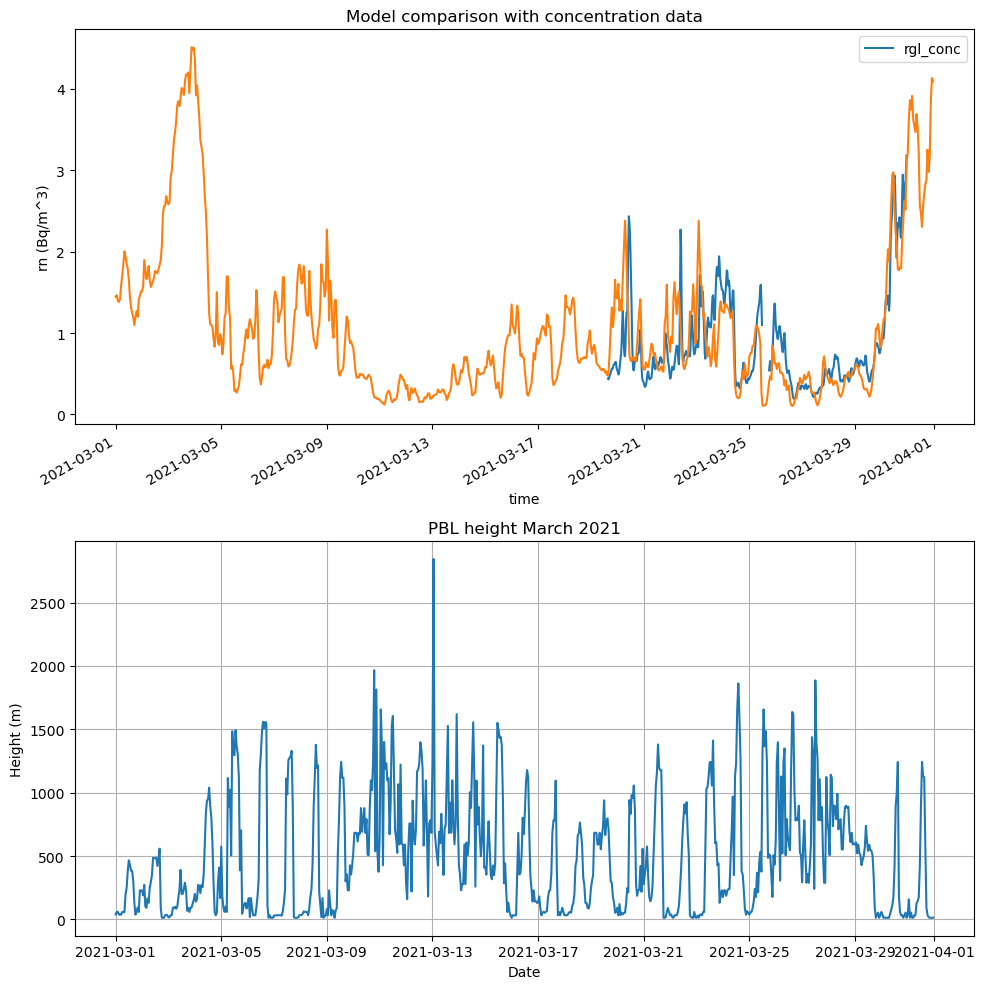

In [85]:
# Filter rgl_conc data for March 2021
rgl_conc_mar21 = rgl_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_conc_mar21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202103.time, rn_mar21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(rgl_202103['time'], rgl_202103['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height March 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()



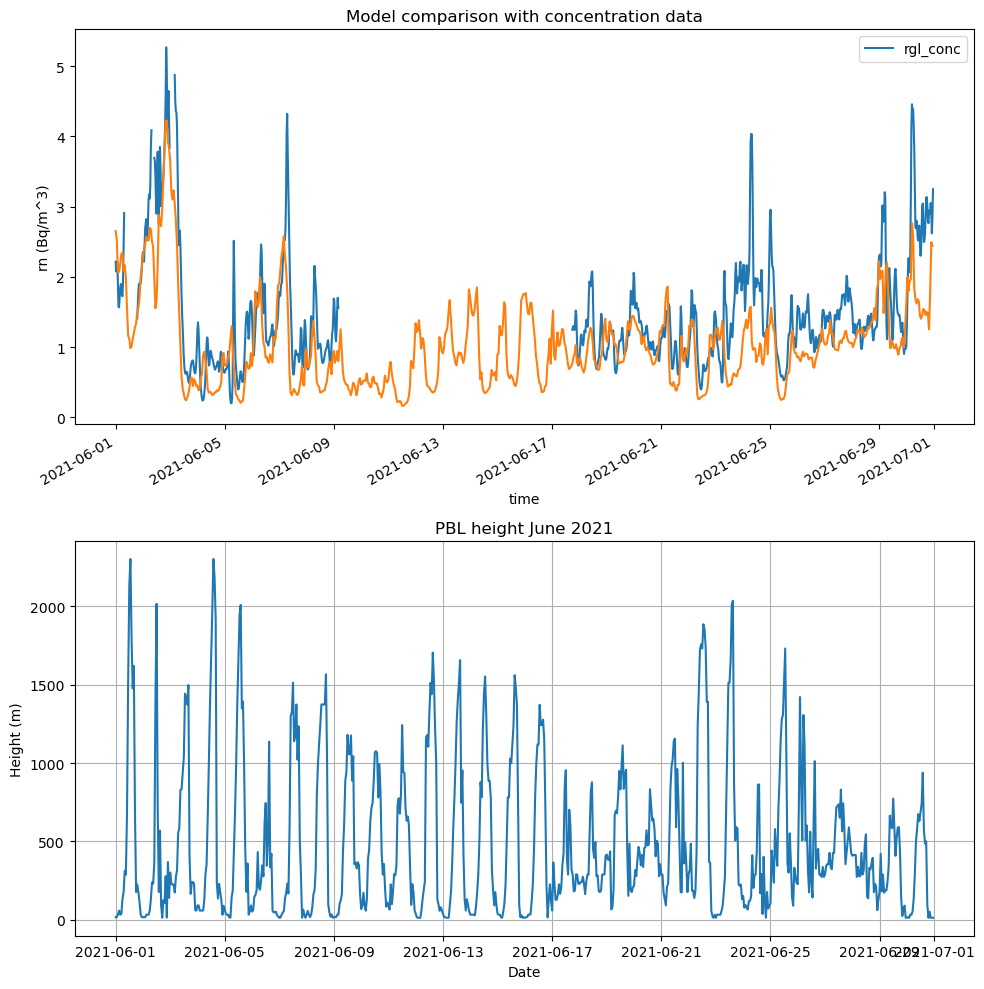

In [86]:
# Filter rgl_conc data for March 2021
rgl_conc_Jun21 = rgl_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_conc_Jun21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202106.time, rn_jun21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(rgl_202106['time'], rgl_202106['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height June 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

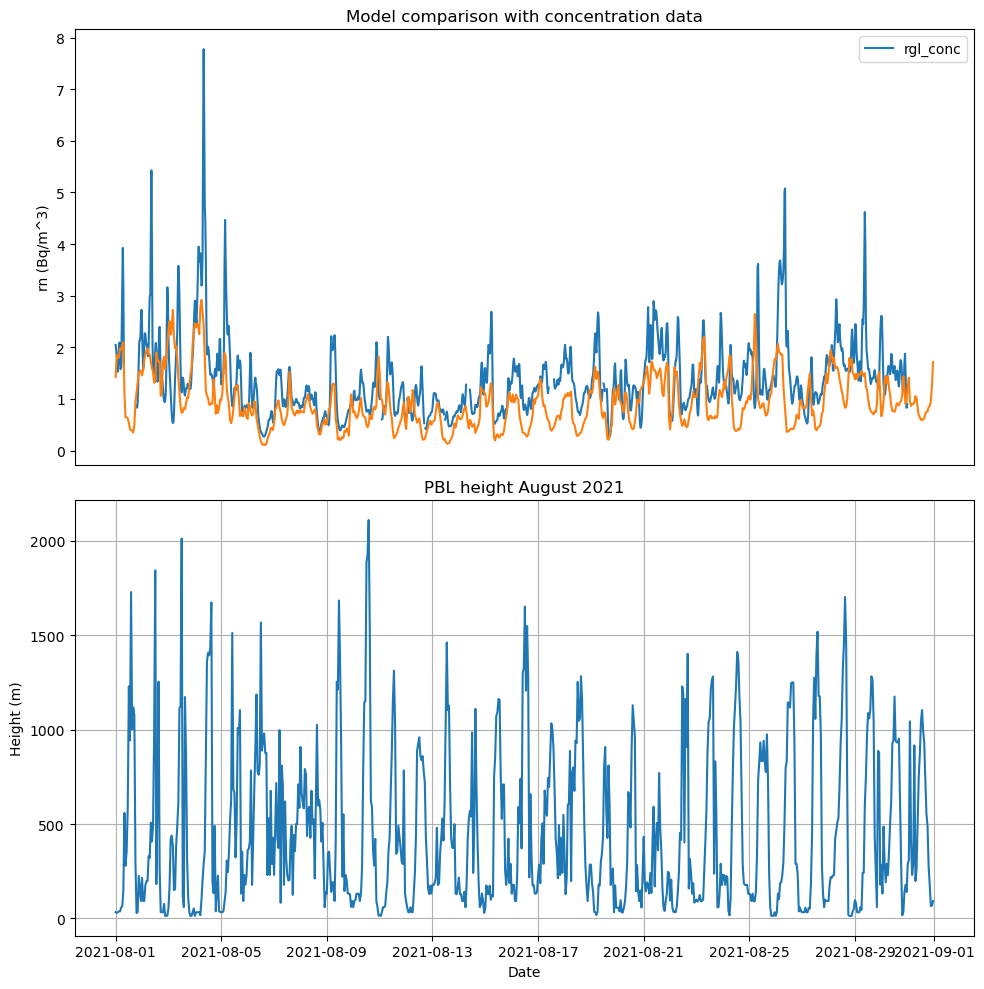

In [87]:
# Filter rgl_conc data for August 2021
rgl_conc_aug21 = rgl_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_conc_aug21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202108.time, rn_aug21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(rgl_202108['time'], rgl_202108['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height August 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

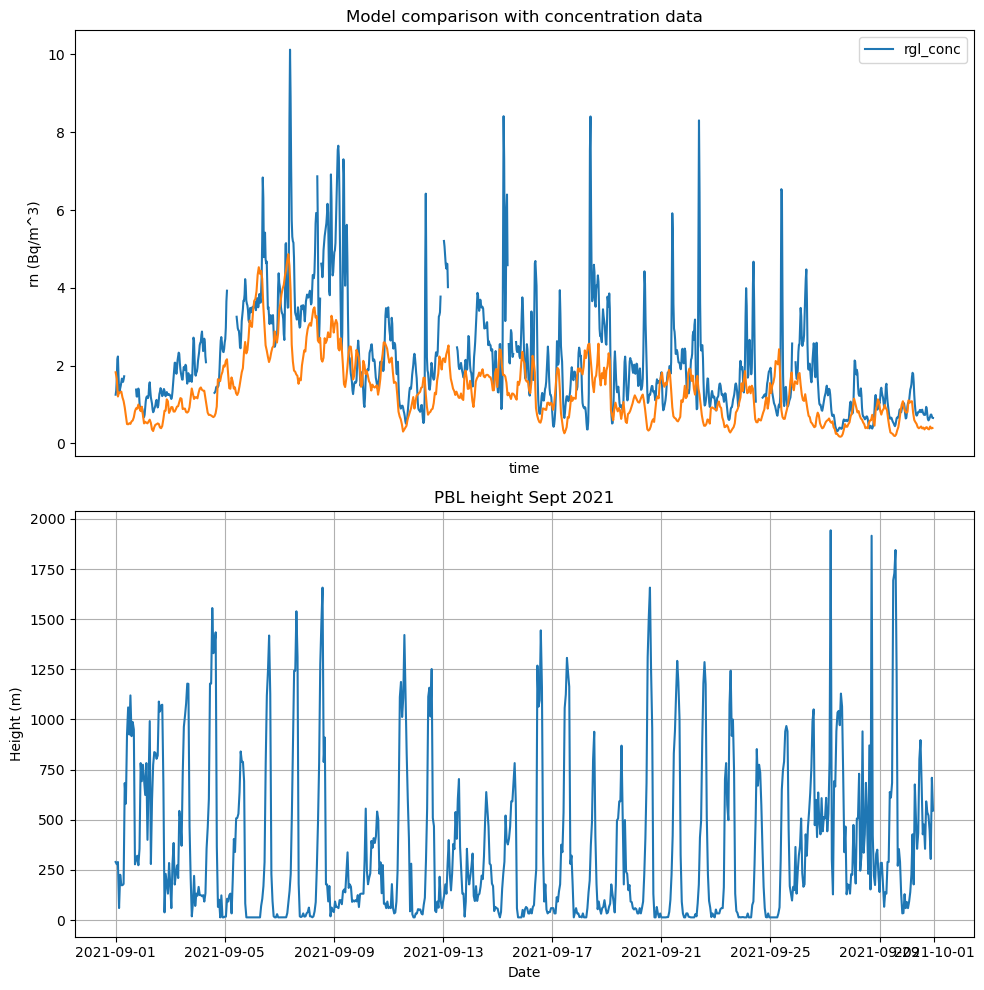

In [88]:
# Filter rgl_conc data for March 2021
rgl_conc_sep21 = rgl_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_conc_sep21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202109.time, rn_sep21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])

# Plot PBL height on the second subplot
ax2.plot(rgl_202109['time'], rgl_202109['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Sept 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

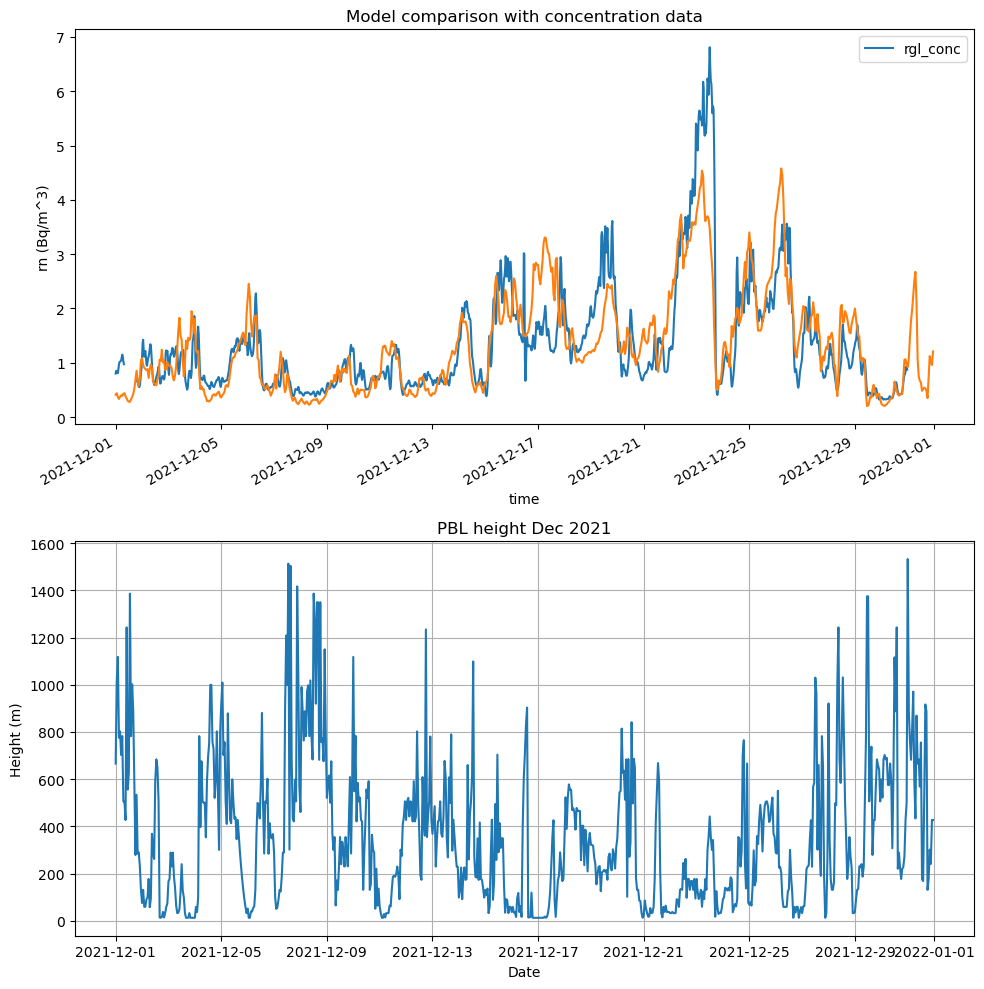

In [89]:
# Filter rgl_conc data for March 2021
rgl_conc_dec21 = rgl_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_conc_dec21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202112.time, rn_dec21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(rgl_202112['time'], rgl_202112['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Dec 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

Comparison for results - TAC ERA5

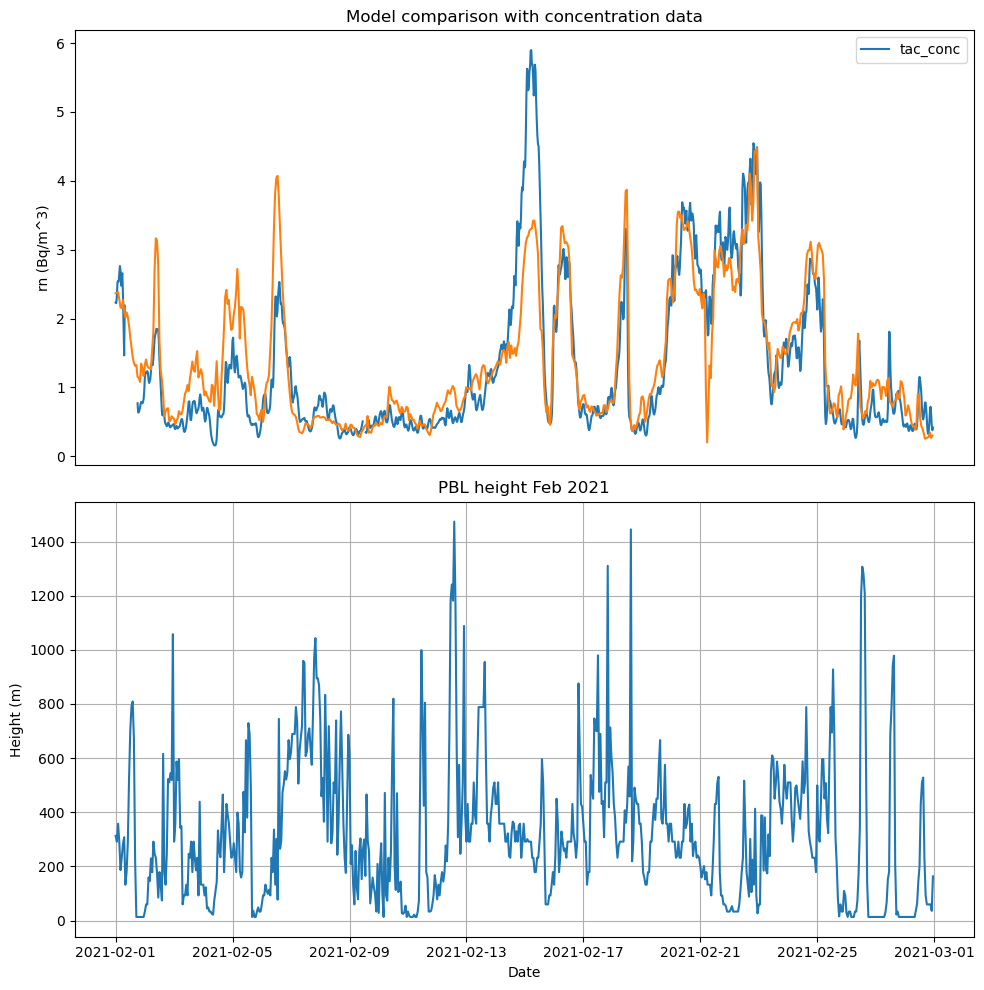

In [90]:
tac_conc_feb21 = tac_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_conc_feb21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202102.time, tac_feb21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(tac_202102['time'], tac_202102['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Feb 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

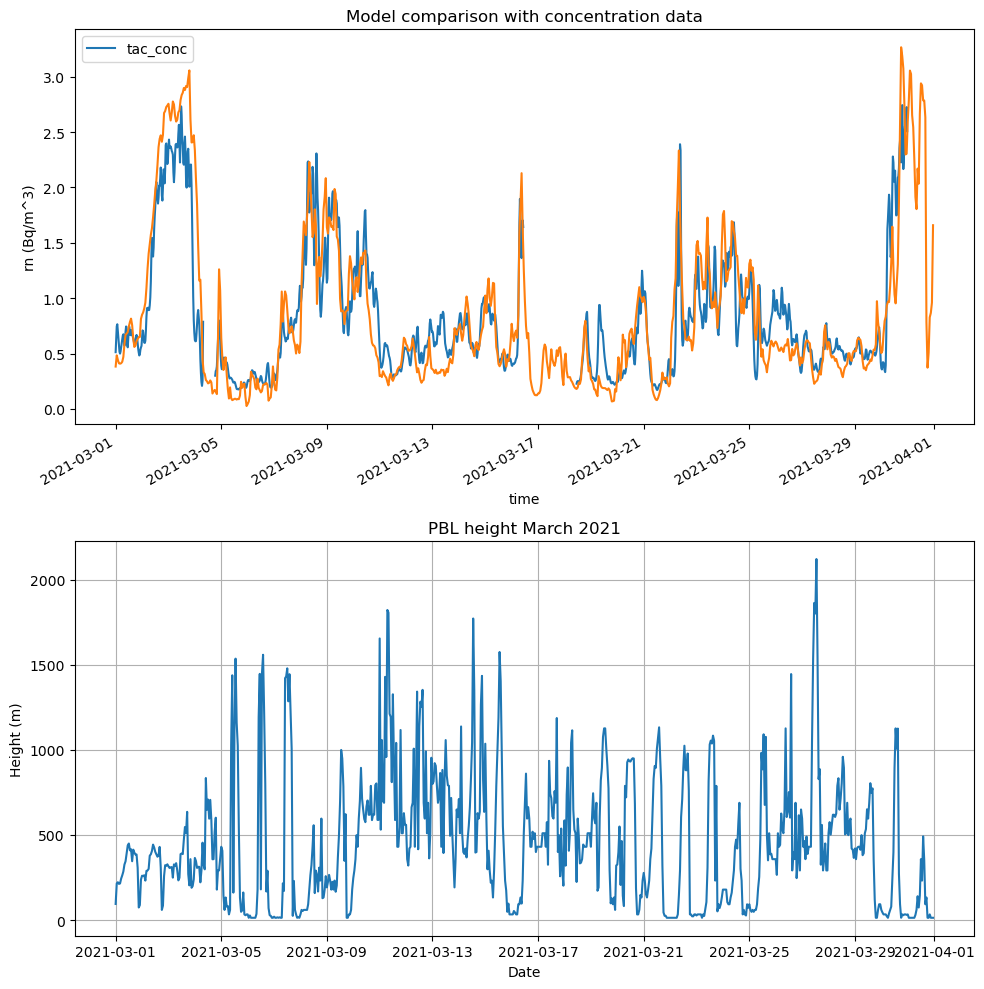

In [91]:
tac_conc_march21 = tac_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_conc_march21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202103.time, tac_mar21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202103['time'], tac_202103['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height March 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

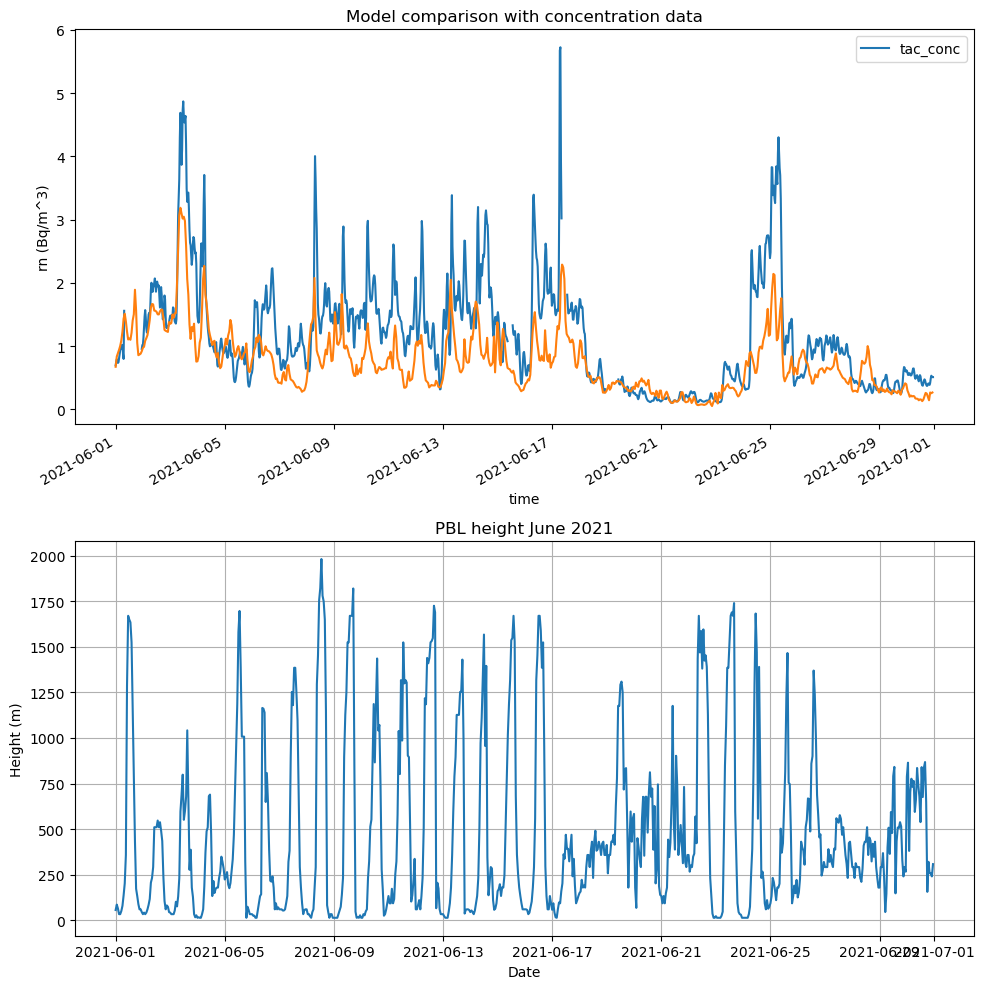

In [92]:
tac_conc_jun21 = tac_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_conc_jun21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202106.time, tac_jun21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202106['time'], tac_202106['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height June 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

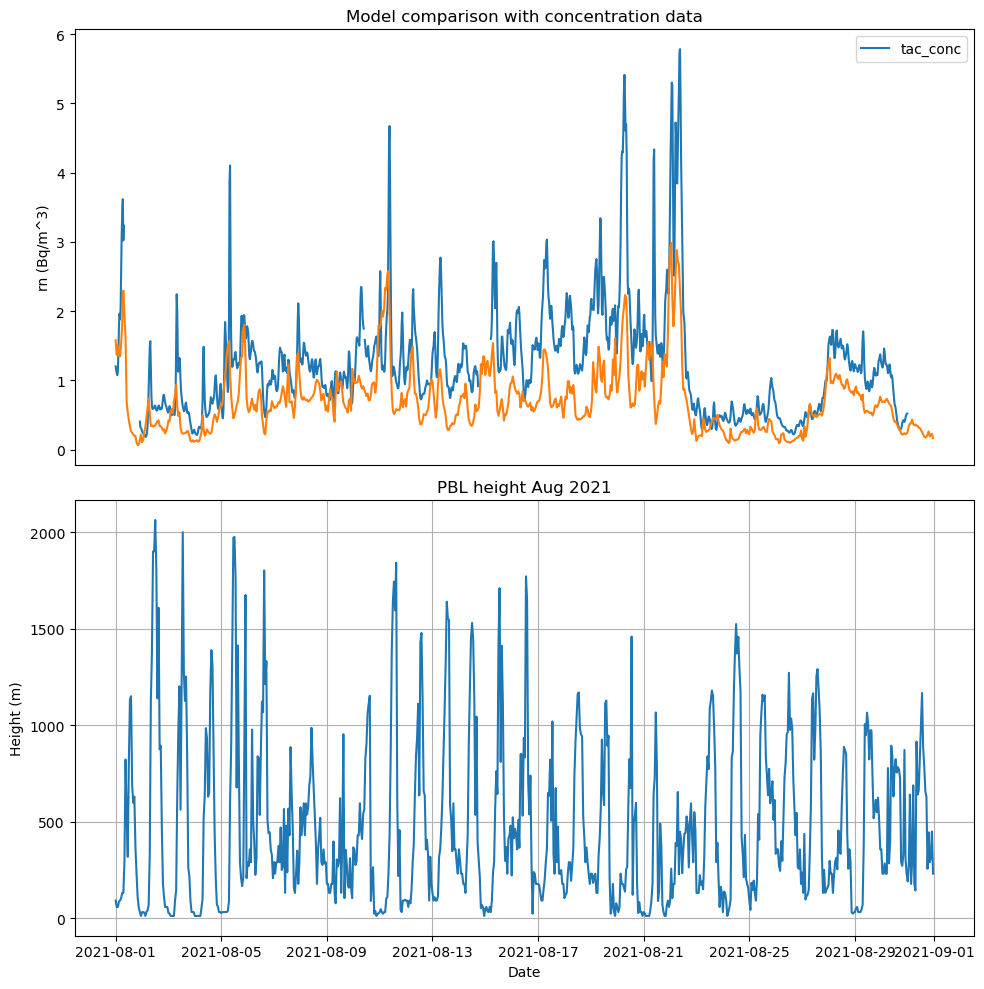

In [93]:
tac_conc_aug21 = tac_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_conc_aug21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202108.time, tac_aug21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(tac_202108['time'], tac_202108['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Aug 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

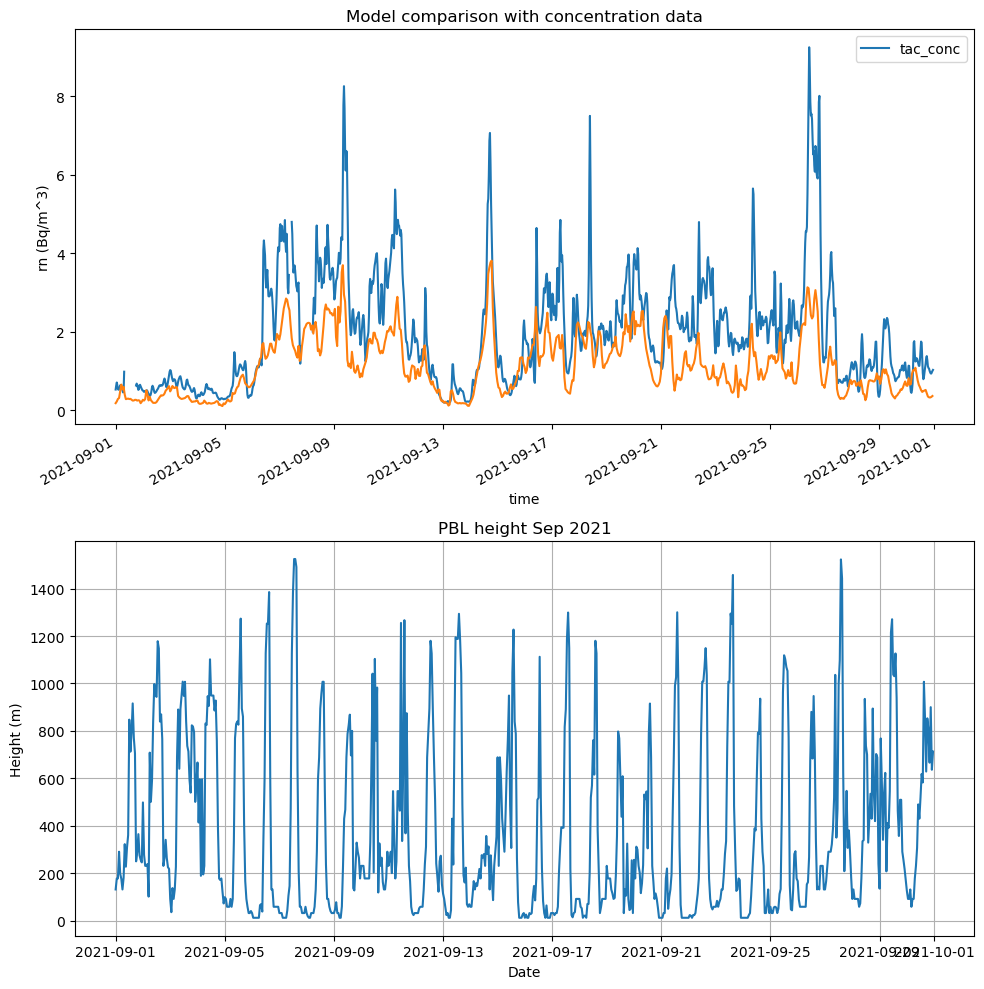

In [94]:
tac_conc_sep21 = tac_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_conc_sep21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202109.time, tac_sep21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202109['time'], tac_202109['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Sep 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

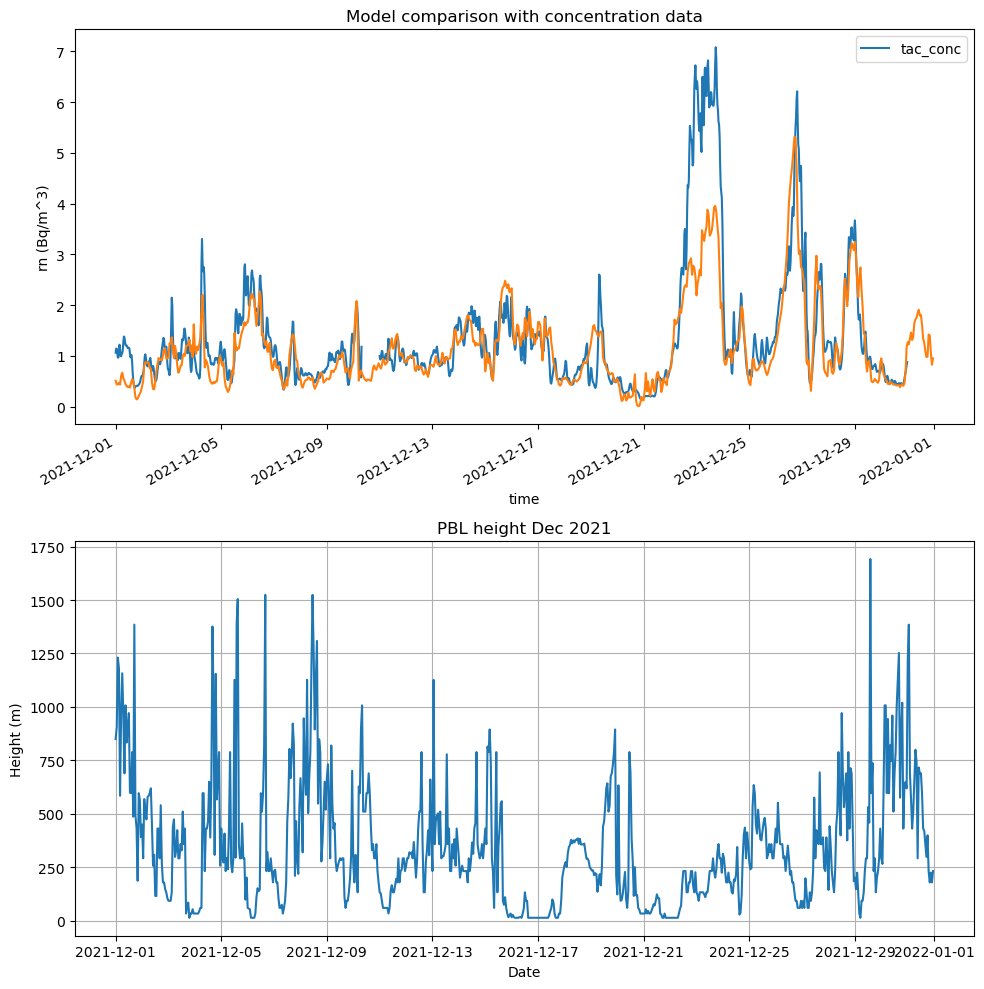

In [95]:
tac_conc_dec21 = tac_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_conc_dec21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202112.time, tac_dec21)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202112['time'], tac_202112['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Dec 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

Results for comparison - GLDAS RGL

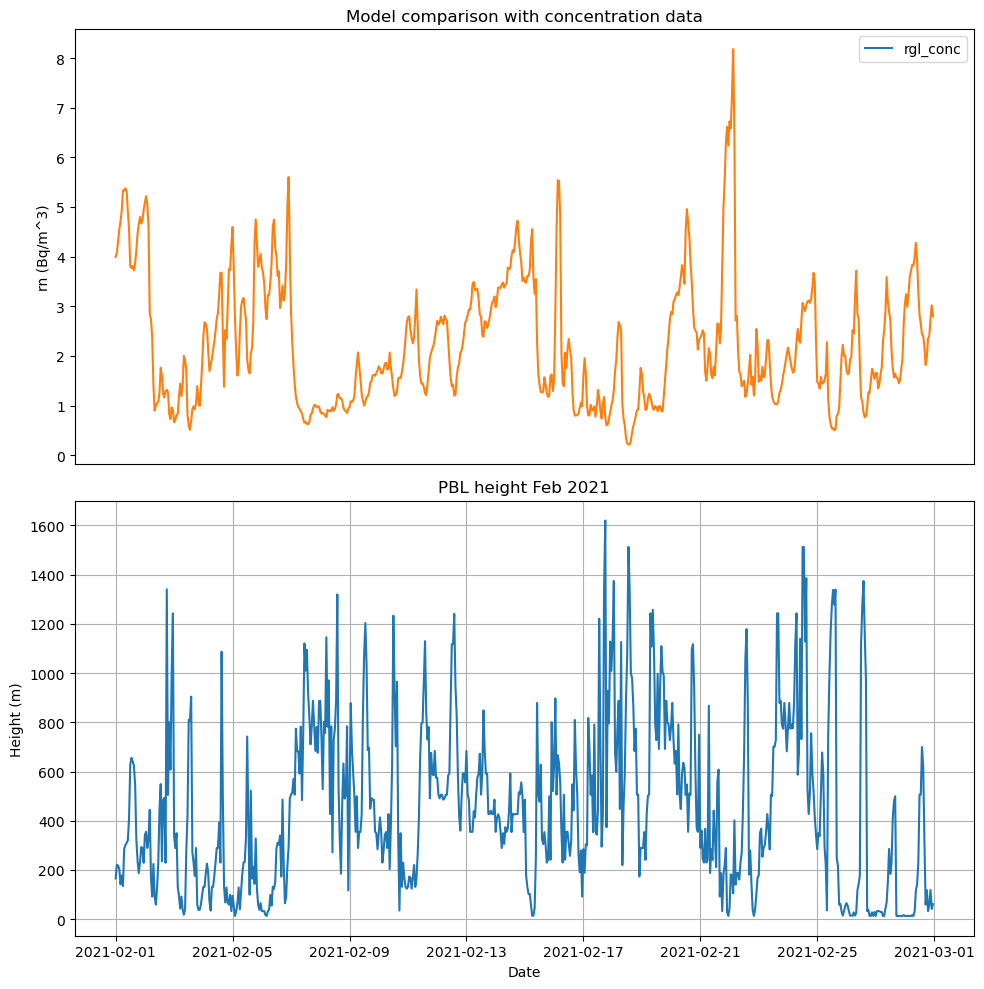

In [96]:
rgl_g_conc_feb21 = rgl_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_g_conc_feb21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202102.time, rn_gldas_feb)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(rgl_202102['time'], rgl_202102['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Feb 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

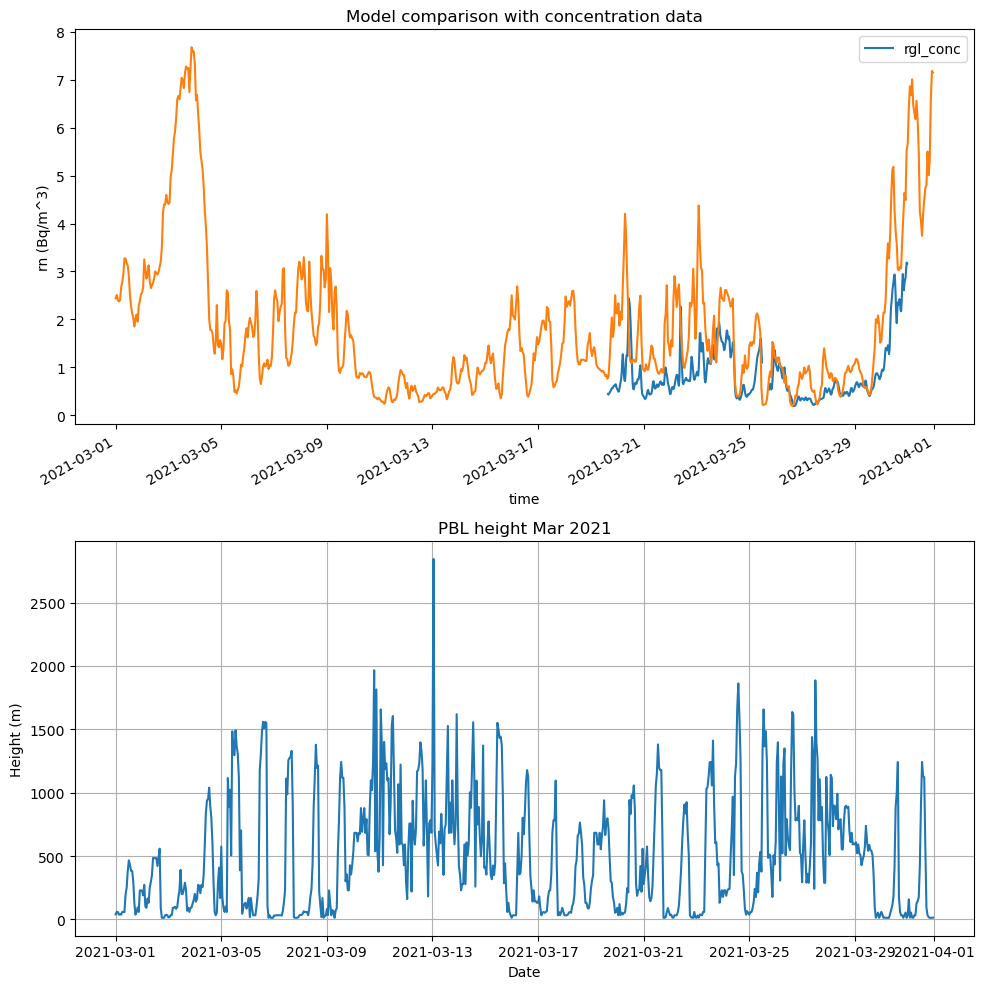

In [97]:
rgl_g_conc_mar21 = rgl_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_g_conc_mar21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202103.time, rn_gldas_mar)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(rgl_202103['time'], rgl_202103['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Mar 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

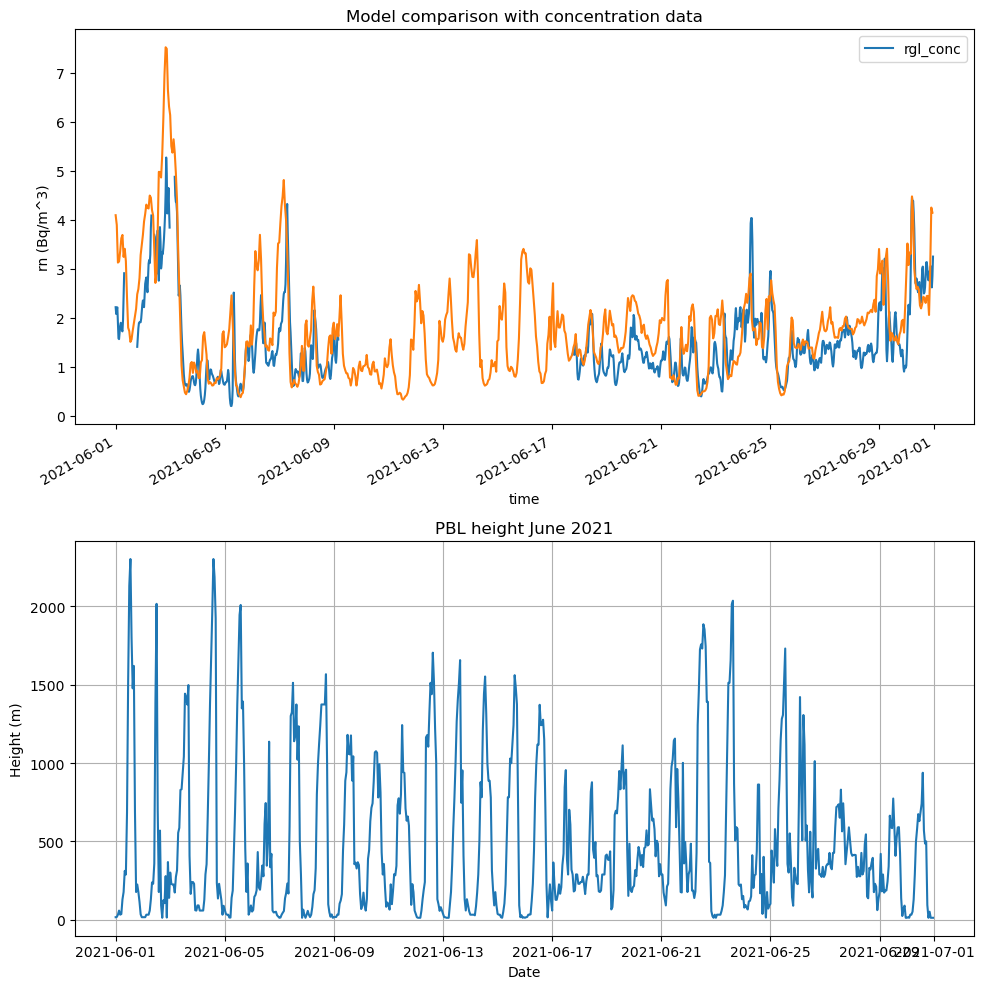

In [98]:
rgl_g_conc_jun21 = rgl_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_g_conc_jun21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202106.time, rn_gldas_jun)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(rgl_202106['time'], rgl_202106['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height June 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

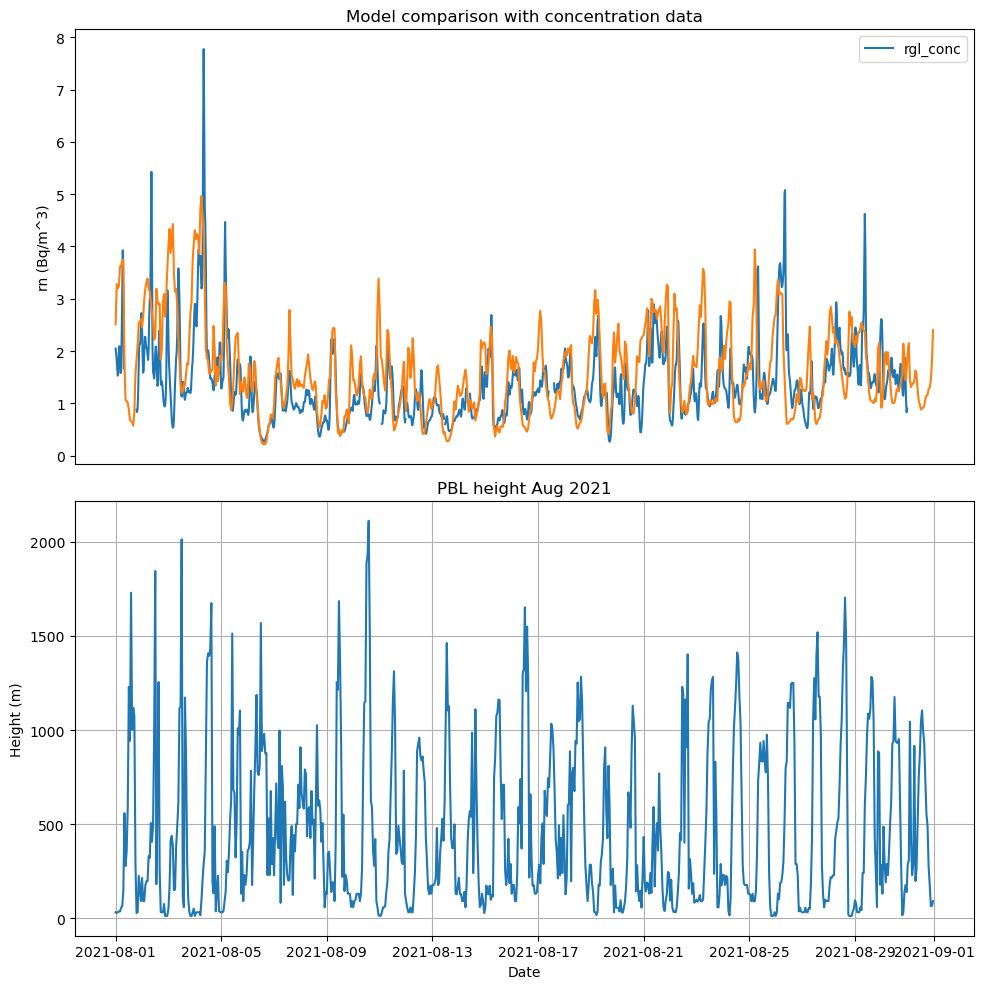

In [99]:
rgl_g_conc_aug21 = rgl_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_g_conc_aug21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202108.time, rn_gldas_aug)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(rgl_202108['time'], rgl_202108['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Aug 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

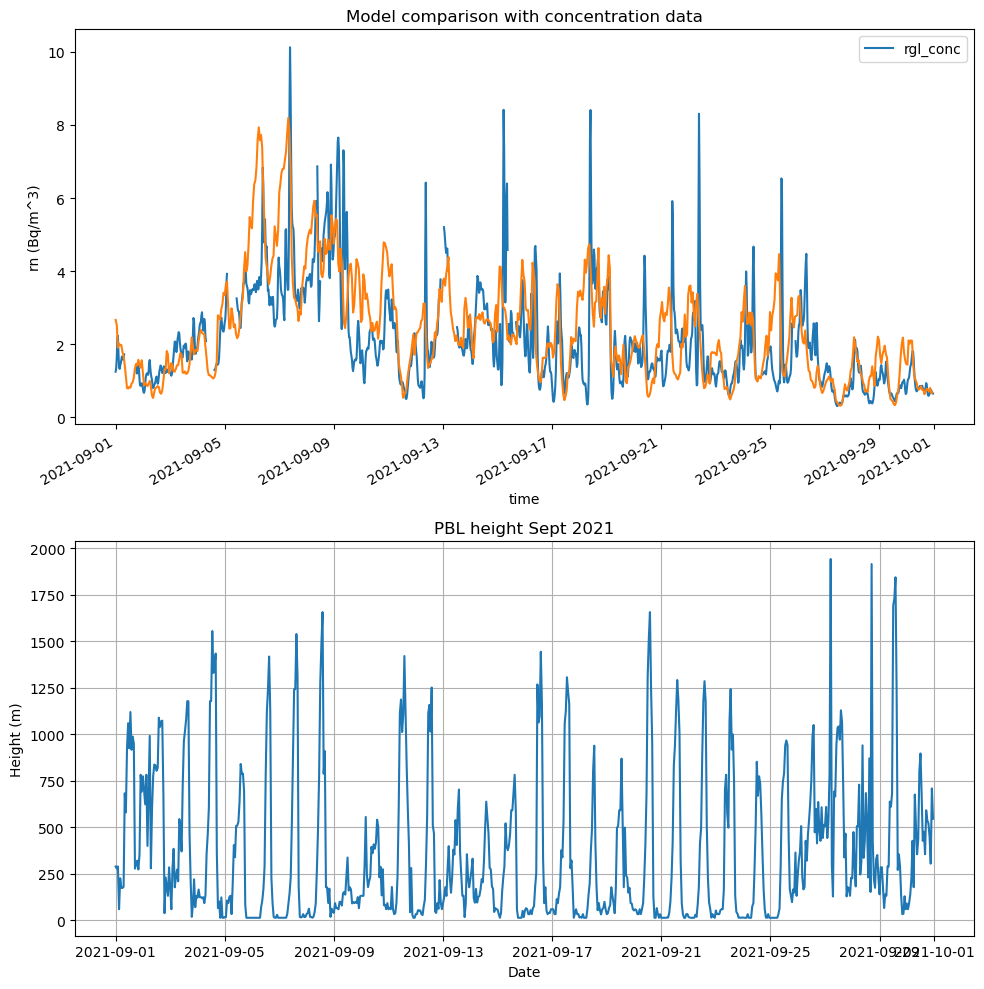

In [100]:
rgl_g_conc_sep21 = rgl_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_g_conc_sep21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202109.time, rn_gldas_sep)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(rgl_202109['time'], rgl_202109['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Sept 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

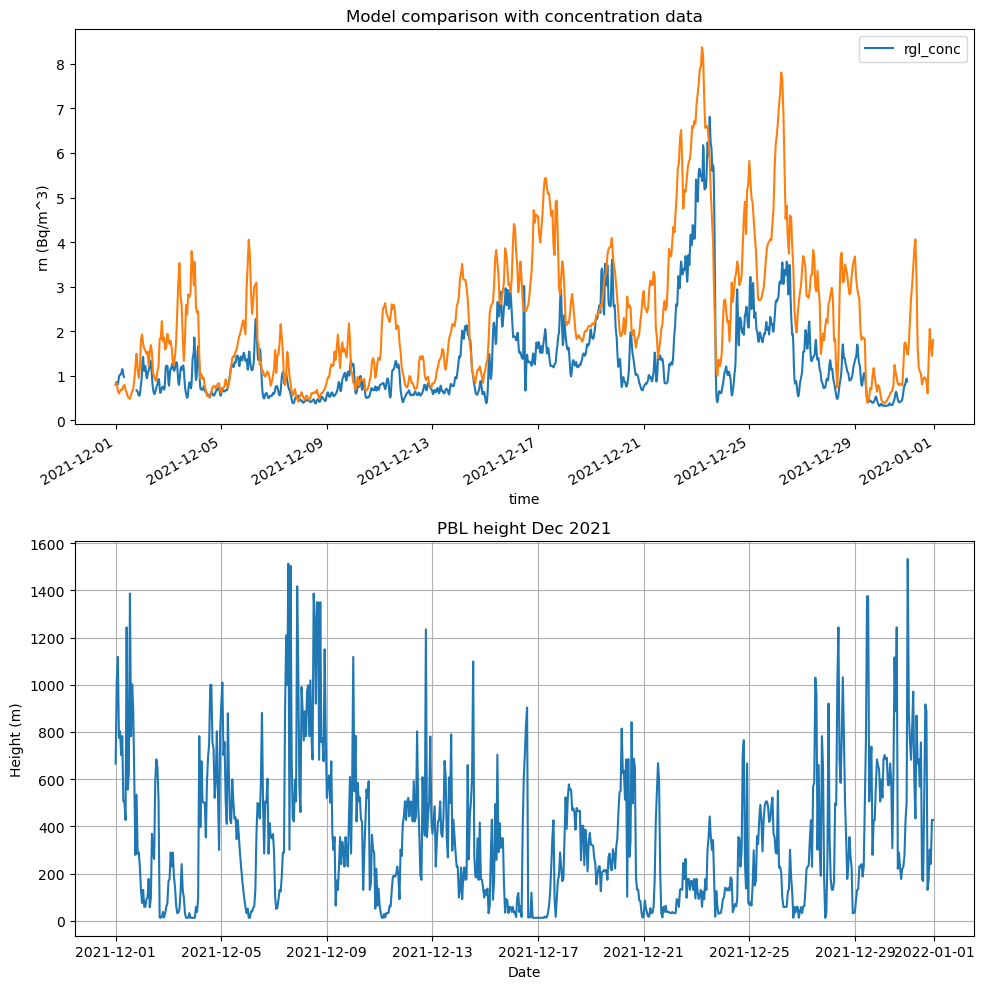

In [101]:
rgl_g_conc_dec21 = rgl_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
rgl_g_conc_dec21.radon.plot(ax=ax1, label='rgl_conc')
ax1.plot(rgl_202112.time, rn_gldas_dec)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(rgl_202112['time'], rgl_202112['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Dec 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

Results comparison - GLDAS TAC

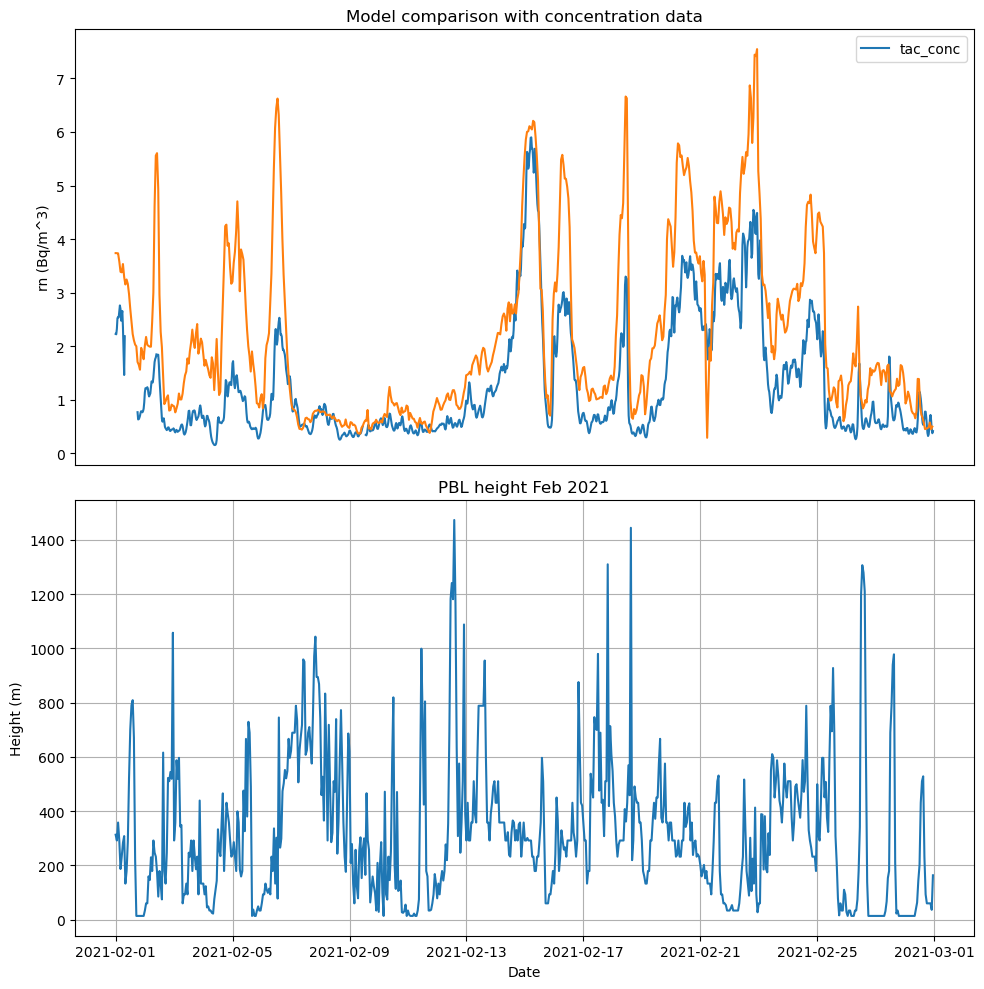

In [102]:
tac_g_conc_feb21 = tac_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_g_conc_feb21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202102.time, tac_gldas_feb)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(tac_202102['time'], tac_202102['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Feb 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

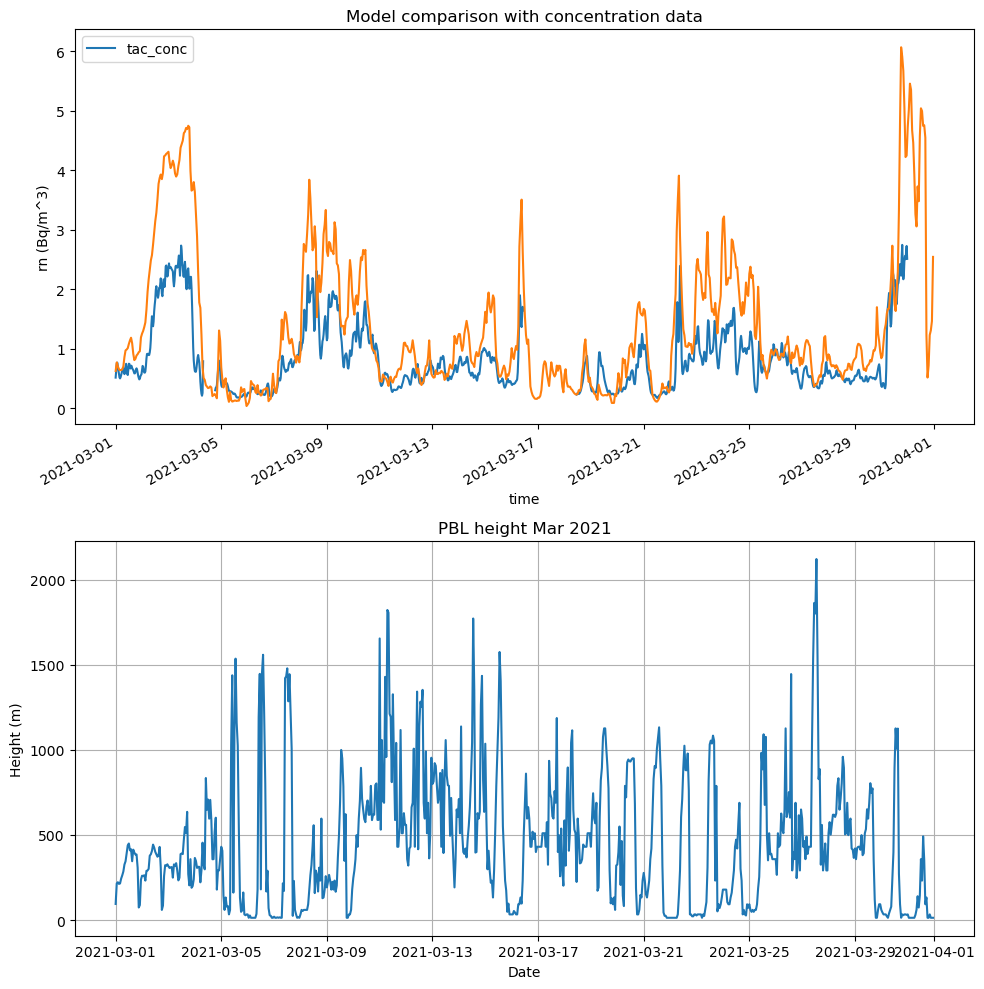

In [103]:
tac_g_conc_mar21 = tac_conc.sel(time=slice('2021-03-01', '2021-03-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_g_conc_mar21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202103.time, tac_gldas_mar)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202103['time'], tac_202103['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Mar 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

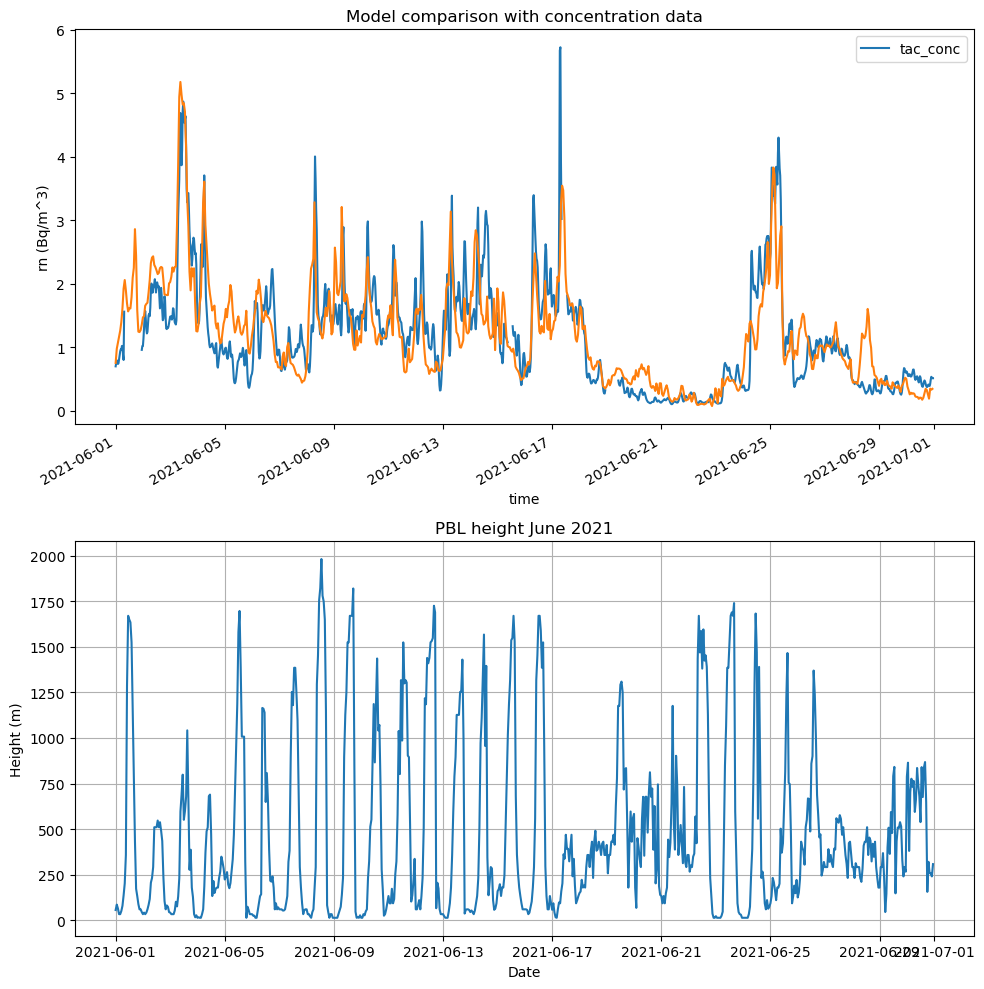

In [104]:
tac_g_conc_jun21 = tac_conc.sel(time=slice('2021-06-01', '2021-06-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_g_conc_jun21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202106.time, tac_gldas_jun)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202106['time'], tac_202106['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height June 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

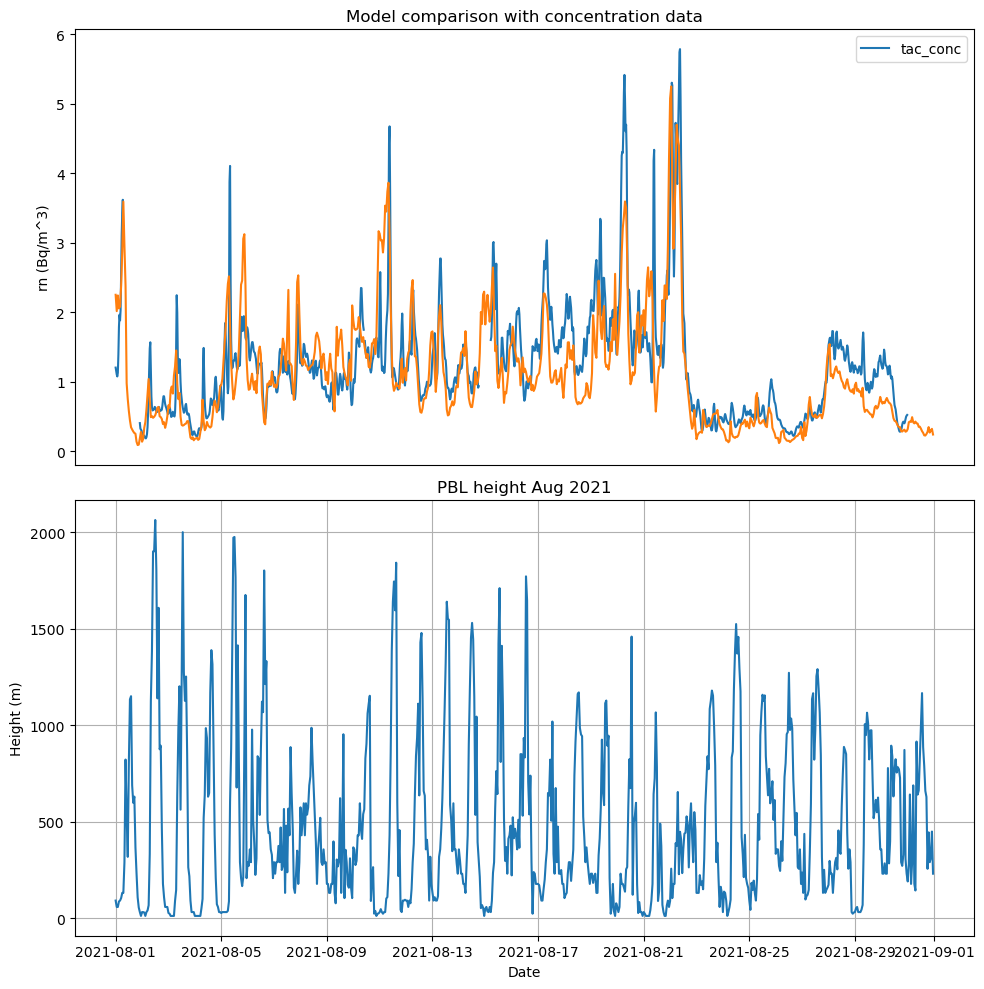

In [105]:
tac_g_conc_aug21 = tac_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_g_conc_aug21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202108.time, tac_gldas_aug)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Remove x-axis labels and ticks from the first subplot
ax1.set_xticks([])
ax1.set_xlabel('')  # Remove x-axis title

# Plot PBL height on the second subplot
ax2.plot(tac_202108['time'], tac_202108['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Aug 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

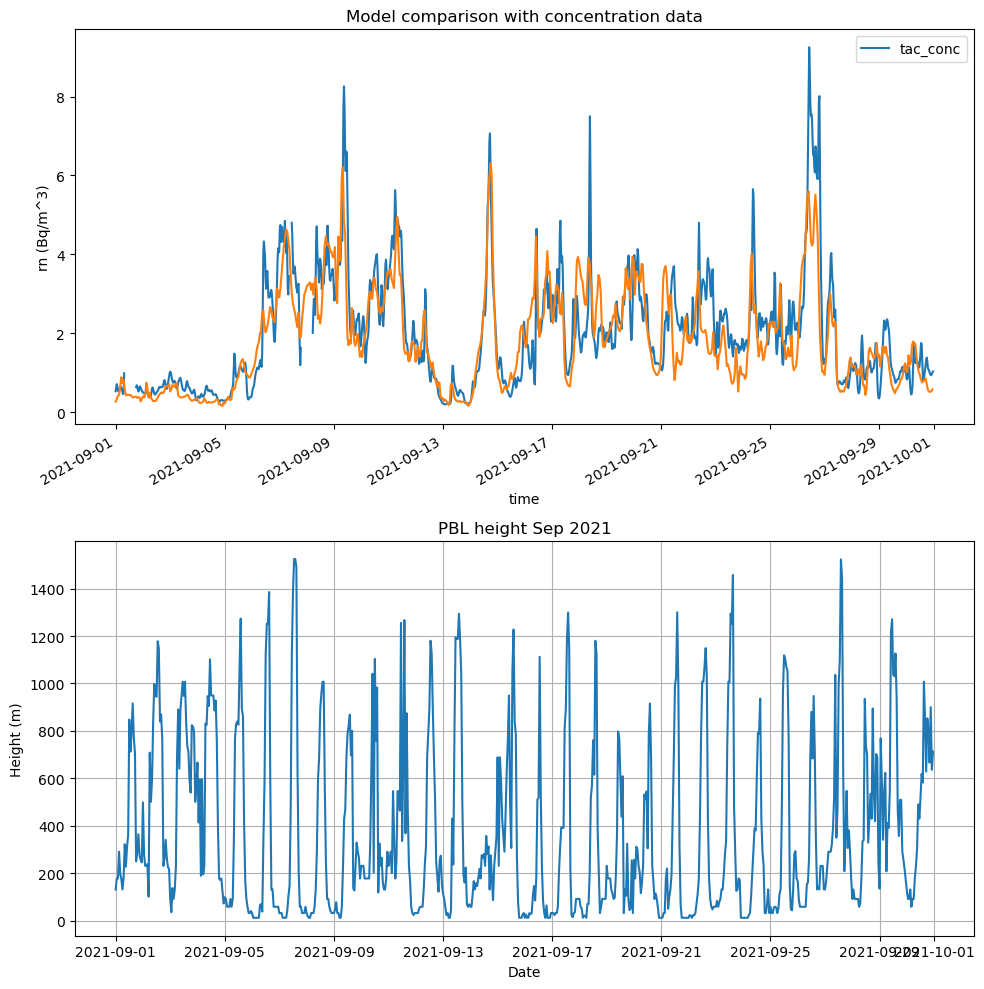

In [106]:
tac_g_conc_sep21 = tac_conc.sel(time=slice('2021-09-01', '2021-09-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_g_conc_sep21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202109.time, tac_gldas_sep)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202109['time'], tac_202109['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Sep 2021')
ax2.grid(True)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

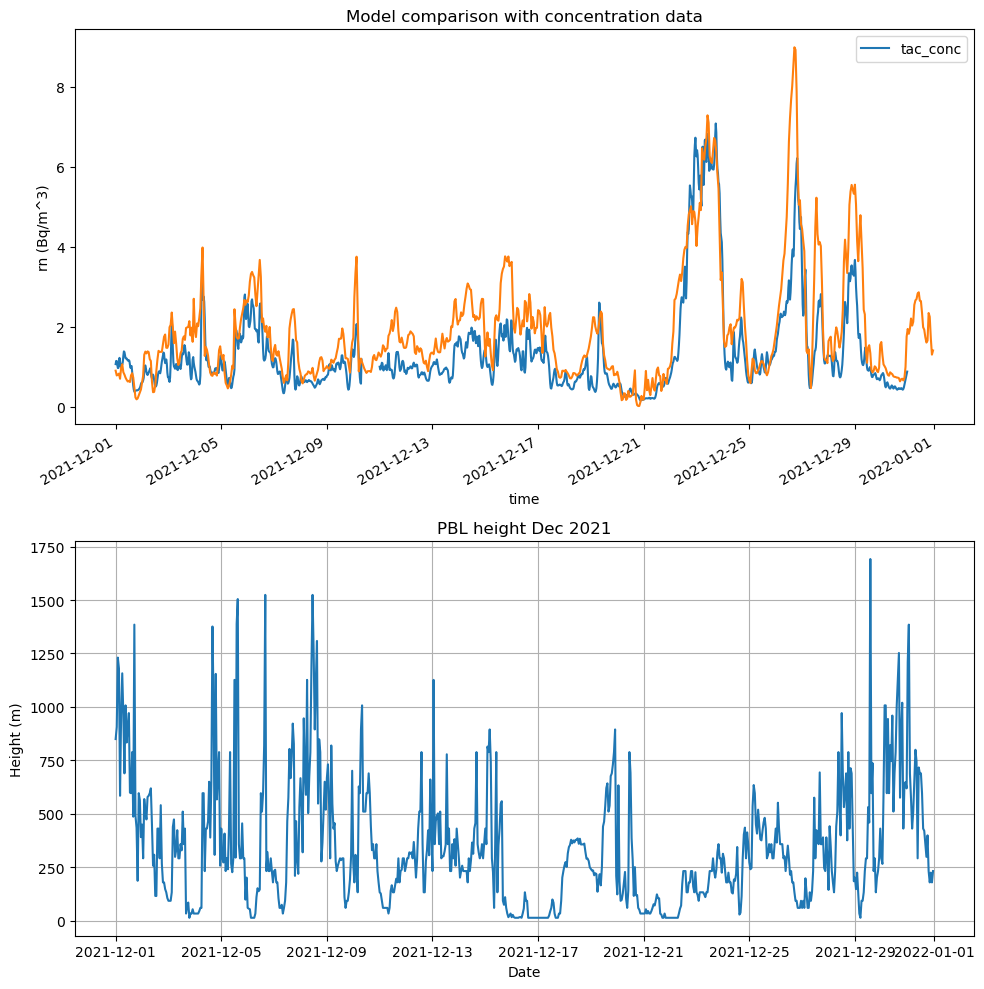

In [107]:

tac_g_conc_dec21 = tac_conc.sel(time=slice('2021-12-01', '2021-12-30'))

# Create a figure and two subplots vertically stacked
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

# Plot radon concentration on the first subplot
tac_g_conc_dec21.radon.plot(ax=ax1, label='tac_conc')
ax1.plot(tac_202112.time, tac_gldas_dec)
ax1.set_ylabel("rn (Bq/m^3)")
ax1.set_title('Model comparison with concentration data')
ax1.legend()

# Plot PBL height on the second subplot
ax2.plot(tac_202112['time'], tac_202112['PBLH'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Height (m)')
ax2.set_title('PBL height Dec 2021')
ax2.grid(True)


# Adjust layout and display the plot
plt.tight_layout()
plt.show()


Comparison of Results and Temp 

In [108]:
rgl_202102

<xarray.Dataset>
Dimensions:               (time: 672, lon: 391, lat: 293, lev: 1, height: 20)
Coordinates:
  * time                  (time) datetime64[ns] 2021-02-01 ... 2021-02-28T23:...
  * lon                   (lon) float32 -97.9 -97.55 -97.2 ... 38.68 39.03 39.38
  * lat                   (lat) float32 10.73 10.96 11.2 ... 78.59 78.82 79.06
  * lev                   (lev) |S1 b'F'
  * height                (height) float32 500.0 1.5e+03 ... 1.85e+04 1.95e+04
Data variables: (12/16)
    fp                    (lat, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    temperature           (time) float32 -0.009521 -0.1345 ... 5.834 5.275
    pressure              (time) float32 966.1 966.5 ... 1.008e+03 1.008e+03
    wind_speed            (time) float32 5.84 5.488 4.732 ... 6.897 6.579 7.63
    wind_direction        (time) float32 48.5 52.1 54.86 ... 65.29 69.85 55.47
    PBLH                  (time) float32 165.7 221.1 217.2 ... 118.3 41.9 61.38
    ...                    ...
    particle_locations_s  (height, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    particle_locations_w  (height, lat, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_n  (height, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_e  (height, lat, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_s  (height, lon, time) float32 0.0 0.0 0.0 ... 0.0 0.0
    mean_age_particles_w  (height, lat, time) float32 0.0 0.0 0.0 ... 0.0 0.0
Attributes: (12/18)
    fp_output_units:              ppm s
    fp_output:                    Mixing Ratio
    species:                      Rn
    species_lifetime_hrs:         132.3768
    model:                        NAME
    met_model:                    UKV
    ...                           ...
    author:                       Met Office/University of Bristol
    contact:                      Alistair Manning
    file_created_by:              apaj
    funder:                       BEIS
    publication_acknowledgement:  Please acknowledge the Met Office/Universit...
    created:                      2022-10-26 10:53:21.715491

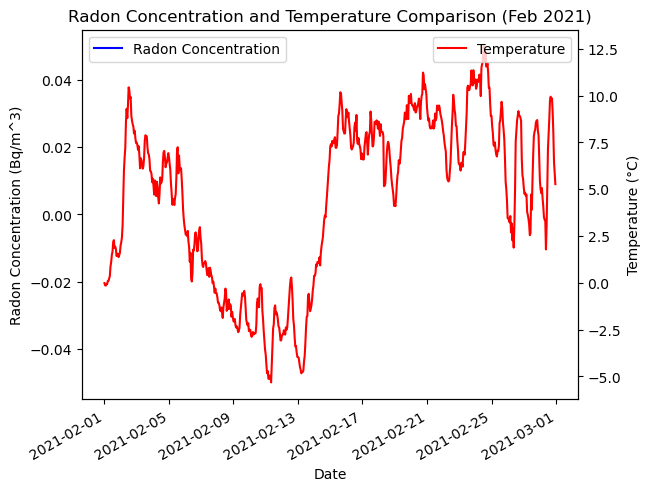

In [109]:
# Filter rgl_temp data for Feb 2021
temp_rgl_temp_feb21 = rgl_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Create figure and axis objects
fig, ax1 = plt.subplots()

# Plotting radon concentration on the first y-axis
temp_rgl_temp_feb21.radon.plot(ax=ax1, label='Radon Concentration', color='blue')
ax1.set_ylabel('Radon Concentration (Bq/m^3)')
ax1.legend(loc='upper left')

# Create a second y-axis
ax2 = ax1.twinx()

# Plotting temperature on the second y-axis
rgl_202102.temperature.plot(ax=ax2, label='Temperature', color='red')
ax2.set_ylabel('Temperature (°C)')
ax2.legend(loc='upper right')

# Set common x-axis label
ax1.set_xlabel('Date')

# Show plot
plt.title('Radon Concentration and Temperature Comparison (Feb 2021)')
plt.show()

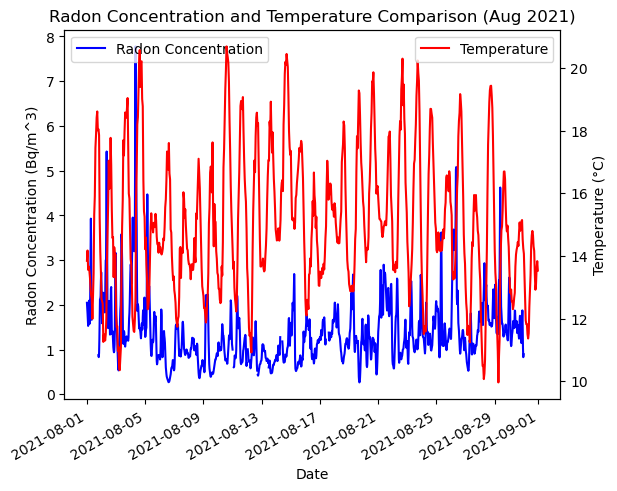

In [110]:
temp_rgl_temp_aug21 = rgl_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Create figure and axis objects
fig, ax1 = plt.subplots()

# Plotting radon concentration on the first y-axis
temp_rgl_temp_aug21.radon.plot(ax=ax1, label='Radon Concentration', color='blue')
ax1.set_ylabel('Radon Concentration (Bq/m^3)')
ax1.legend(loc='upper left')

# Create a second y-axis
ax2 = ax1.twinx()

# Plotting temperature on the second y-axis
rgl_202108.temperature.plot(ax=ax2, label='Temperature', color='red')
ax2.set_ylabel('Temperature (°C)')
ax2.legend(loc='upper right')

# Set common x-axis label
ax1.set_xlabel('Date')

# Show plot
plt.title('Radon Concentration and Temperature Comparison (Aug 2021)')
plt.show()

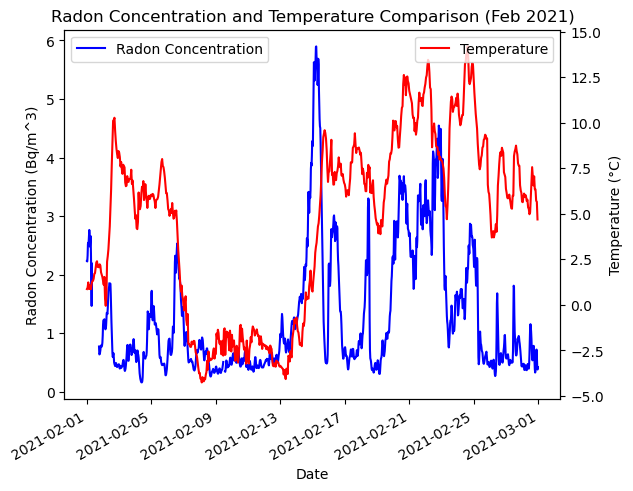

In [111]:
temp_tac_temp_feb21 = tac_conc.sel(time=slice('2021-02-01', '2021-02-28'))

# Create figure and axis objects
fig, ax1 = plt.subplots()

# Plotting radon concentration on the first y-axis
temp_tac_temp_feb21.radon.plot(ax=ax1, label='Radon Concentration', color='blue')
ax1.set_ylabel('Radon Concentration (Bq/m^3)')
ax1.legend(loc='upper left')

# Create a second y-axis
ax2 = ax1.twinx()

# Plotting temperature on the second y-axis
tac_202102.temperature.plot(ax=ax2, label='Temperature', color='red')
ax2.set_ylabel('Temperature (°C)')
ax2.legend(loc='upper right')

# Set common x-axis label
ax1.set_xlabel('Date')

# Show plot
plt.title('Radon Concentration and Temperature Comparison (Feb 2021)')
plt.show()

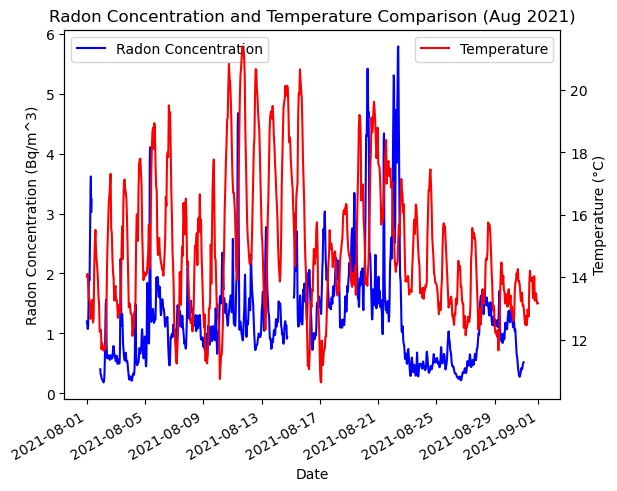

In [112]:
temp_tac_temp_aug21 = tac_conc.sel(time=slice('2021-08-01', '2021-08-30'))

# Create figure and axis objects
fig, ax1 = plt.subplots()

# Plotting radon concentration on the first y-axis
temp_tac_temp_aug21.radon.plot(ax=ax1, label='Radon Concentration', color='blue')
ax1.set_ylabel('Radon Concentration (Bq/m^3)')
ax1.legend(loc='upper left')

# Create a second y-axis
ax2 = ax1.twinx()

# Plotting temperature on the second y-axis
tac_202108.temperature.plot(ax=ax2, label='Temperature', color='red')
ax2.set_ylabel('Temperature (°C)')
ax2.legend(loc='upper right')

# Set common x-axis label
ax1.set_xlabel('Date')

# Show plot
plt.title('Radon Concentration and Temperature Comparison (Aug 2021)')
plt.show()